# Diagnostic Notebook — JWST UVLF / exotic transient DE campaign

Pre-publication chain inspection. Change `RUN` (single mode) or `RUNS` (compare mode) below, **Run All**.

Burn-in: 30% (locked).
Chain-only: no `minimize`, no CLASS calls. True $\chi^2_{\min}$ comes later from `paper_analysis.py`.


In [1]:
# ── Configuration ───────────────────────────────────────────────────
# SINGLE mode:  set RUN, leave RUNS = None
# COMPARE mode: set RUNS to a list of names, or "all-converged"

# RUN  = "exo_uvlf_bg_cmb_fixed_full"
# RUNS = None
# RUNS = ["exo_uvlf_bg_cmb_fixed_full", "lcdm_uvlf_bg_cmb_fixed_full"]
RUN = None
RUNS = "all-converged"

MODE     = "compare"           # "single" | "compare" | "auto"
BURN_IN  = 0.3
BASE_DIR = "runs"
SAVE_PDF = False
FIG_DIR  = "figs/diagnostic"

# §3 triangle plot: include derived parameters?
TRIANGLE_INCLUDE_DERIVED = True

# §6 w(z) bands: number of posterior draws
WZ_N_DRAWS = 500

# Project path (where jwst_likelihood_uvlf.py lives) — only needed if you
# extend §5 to overlay model predictions (currently chain-only)
PROJECT_PYPATH = "."


## Imports & constants

In [2]:
import os, sys, json, re, warnings
from pathlib import Path
from dataclasses import dataclass, field
from typing import Optional, List, Dict, Tuple, Union

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

from getdist import loadMCSamples, plots

# ── Inline-display fix (round 2) ──────────────────────────────────
# getdist sets backend=Agg, which makes plt.show() a no-op AND prevents
# matplotlib_inline from installing Figure._repr_png_. So display(fig) falls
# back to __repr__. Fix: savefig to PNG buffer + IPython.Image, backend-agnostic.
import io
from IPython.display import display, Image

# Try switching backend back to inline first (cleanest if it works)
try:
    plt.switch_backend("module://matplotlib_inline.backend_inline")
except Exception:
    pass

def _inline_show(*args, **kwargs):
    fig = plt.gcf()
    if fig.get_axes():
        buf = io.BytesIO()
        fig.savefig(buf, format="png", bbox_inches="tight", dpi=100)
        buf.seek(0)
        display(Image(data=buf.read(), format="png"))
    plt.close(fig)

plt.show = _inline_show

print("plt.show patched — savefig→PNG→Image bypass.")


warnings.filterwarnings("ignore", category=RuntimeWarning)
import logging
logging.getLogger().setLevel(logging.ERROR)

if PROJECT_PYPATH not in sys.path:
    sys.path.insert(0, PROJECT_PYPATH)

# ── Stefanon 2021 SHMR priors (from jwst_likelihood_uvlf.py) ────────
SHMR_PRIORS = {
    "shmr_N":      {"mu": 0.0297, "sig": 0.0065},
    "shmr_log_Mc": {"mu": 11.5,   "sig": 0.2},
    "shmr_beta":   {"mu": 1.35,   "sig": 0.26},
}

# ── Exotic model fixed constants ────────────────────────────────────
Z_C     = 16.0
SIGMA_Z = 3.25

# ── Headline 2D pairs (skipped silently if either param absent) ─────
HEADLINE_PAIRS_EXO = [

   ("a_samp",      "s"),
   ("s",           "omega_cdm"),
   ("s",           "H0"),
    ("s",           "sigma8"),
    ("s",           "Omega_m"),
    ("s",           "shmr_beta"),
  ("s",           "shmr_log_Mc"),
    ("shmr_log_Mc", "shmr_beta"),
 ]

HEADLINE_PAIRS_LCDM = [
    ("omega_cdm",   "H0"),
    ("omega_cdm",   "sigma8"),
    ("omega_cdm",   "Omega_m"),
    ("shmr_log_Mc", "shmr_beta"),
]

# Params to track in cross-run n-sigma shift matrices
CROSS_KEY_PARAMS = ["a_samp", "s", "omega_cdm", "H0", "sigma8", "Omega_m"]

plt.rcParams.update({
    "font.family":     "serif",
    "font.size":       10,
    "axes.labelsize":  11,
    "axes.titlesize":  11,
    "figure.dpi":      110,
    "savefig.dpi":     200,
    "savefig.bbox":    "tight",
})



plt.show patched — savefig→PNG→Image bypass.


## Run-name parser & path resolver

In [3]:
def parse_run_name(name: str) -> dict:
    """Tokenise run name → metadata dict."""
    tokens = name.split("_")
    out = {"name": name}
    if   tokens[0] == "exo":  out["model"] = "exotic"
    elif tokens[0] == "lcdm": out["model"] = "lcdm"
    else:                      out["model"] = None
    out["has_uvlf"]    = any(t in tokens for t in ("uvlf", "primer", "ceers"))
    out["is_non_uvlf"] = not out["has_uvlf"]
    out["data_combo"]  = "_".join(t for t in ("uvlf","primer","ceers","bg","cmb") if t in tokens) or "unknown"
    out["shmr"]        = next((s for s in ("fixed","vbeta","vshmr") if s in tokens), None)
    out["zcut"]        = next((z for z in ("full","restr")          if z in tokens), None)
    return out

def run_path(name: str, base_dir: str = None) -> Path:
    """Canonical chain-root path for a given run."""
    base_dir = base_dir or BASE_DIR
    md_ = parse_run_name(name)
    base = Path(base_dir)
    if md_["is_non_uvlf"]:
        return base / "non_uvlf" / name / "outputs" / name
    return base / md_["model"] / md_["zcut"] / md_["shmr"] / name / "outputs" / name

def find_chain_root(name: str, base_dir: str = None) -> Path:
    """Try canonical path; fall back to recursive search if missing."""
    base_dir = base_dir or BASE_DIR
    p = run_path(name, base_dir)
    if (Path(str(p) + ".1.txt").exists() or
        (p.parent / f"{name}.paramnames").exists()):
        return p
    # Defensive recursive scan
    base = Path(base_dir)
    for cand in base.rglob(f"{name}.paramnames"):
        return cand.parent / name
    for cand in base.rglob(f"{name}.1.txt"):
        return cand.parent / name
    raise FileNotFoundError(f"Cannot locate chain files for run '{name}' under {base_dir}/")


## Loader

In [4]:
@dataclass
class RunData:
    name:        str
    metadata:    dict
    samples:     object                 # getdist MCSamples
    paramnames:  List[str]
    chi2_blocks: Dict[str, str]         # {short: column_name}
    progress:    Optional[pd.DataFrame]
    chain_map:   dict                   # {"theta": dict, "chi2": dict, "minuslogpost": float}
    chain_root:  Path
    per_chain_files: List[Path]

def _read_progress(root: Path) -> Optional[pd.DataFrame]:
    candidates = [Path(str(root) + ".progress"),
                  root.parent / f"{root.name}.progress"]
    for p in candidates:
        if not p.exists():
            continue
        try:
            # Cobaya .progress: whitespace-separated, '#'-prefixed header.
            # comment='#' strips the header line, so we MUST supply names.
            return pd.read_csv(
                p, sep=r"\s+", comment="#", engine="python",
                names=["N", "timestamp", "acceptance_rate", "Rminus1", "Rminus1_cl"],
            )
        except Exception:
            return None
    return None

def _find_chain_map(samples) -> dict:
    pn = samples.getParamNames().list()
    imap = int(np.argmin(samples.loglikes))
    theta = {n: float(samples.samples[imap, pn.index(n)]) for n in pn}
    # Cobaya stores leaf likelihoods (e.g. chi2__bao.desi_dr2) AND
    # group aggregates (chi2__BAO) AND a final chi2 total column.
    # Keeping only leaves (names contain '.') avoids 2x / 3x double-counting.
    chi2 = {n.replace("chi2__",""): theta[n]
            for n in pn
            if n.startswith("chi2__") and "." in n.replace("chi2__", "")}
    return {"theta": theta, "chi2": chi2,
            "minuslogpost": float(samples.loglikes[imap])}

def _list_chain_files(root: Path) -> List[Path]:
    files = []
    for i in range(1, 17):
        p = Path(str(root) + f".{i}.txt")
        if p.exists():
            files.append(p)
    return files

def load_run(name: str, burn_in: float = None, base_dir: str = None) -> RunData:
    burn_in  = burn_in  if burn_in  is not None else BURN_IN
    base_dir = base_dir if base_dir is not None else BASE_DIR
    root = find_chain_root(name, base_dir)
    samples = loadMCSamples(str(root), settings={"ignore_rows": burn_in})
    metadata    = parse_run_name(name)
    paramnames  = samples.getParamNames().list()
    chi2_blocks = {n.replace("chi2__",""): n for n in paramnames if n.startswith("chi2__")}
    progress    = _read_progress(root)
    chain_map   = _find_chain_map(samples)
    chain_files = _list_chain_files(root)
    return RunData(
        name=name, metadata=metadata, samples=samples,
        paramnames=paramnames, chi2_blocks=chi2_blocks,
        progress=progress, chain_map=chain_map,
        chain_root=root, per_chain_files=chain_files,
    )


## Mode resolution & run list

In [5]:
STATE_FILE = Path(BASE_DIR) / ".run_manager_state.json"

def _converged_from_state(state_file: Path) -> List[str]:
    if not state_file.exists():
        raise FileNotFoundError(f"State file not found: {state_file}")
    with open(state_file) as f:
        state = json.load(f)
    # Defensive: state schema may evolve. Try several shapes.
    runs_block = state.get("runs", state)  # outer dict may BE the runs map
    out = []
    for name, info in runs_block.items():
        if not isinstance(info, dict):
            continue
        status = str(info.get("status", "")).upper()
        status = str(info.get("last_known_status", info.get("status", ""))).upper()
        if "CONVERG" in status:
            out.append(name)
    return sorted(out)

def resolve_runs(run_arg, runs_arg, mode_arg) -> Tuple[str, List[str]]:
    if runs_arg == "all-converged":
        runs_arg = _converged_from_state(STATE_FILE)
        if not runs_arg:
            raise ValueError("No converged runs found in .run_manager_state.json")
    if isinstance(runs_arg, (list, tuple)) and len(runs_arg) > 0:
        names = list(runs_arg)
    elif isinstance(run_arg, str) and run_arg:
        names = [run_arg]
    else:
        raise ValueError("Set either RUN (str) or RUNS (list / 'all-converged').")
    if mode_arg == "auto":
        mode = "single" if len(names) == 1 else "compare"
    else:
        mode = mode_arg
    return mode, names

MODE_RESOLVED, RUN_NAMES = resolve_runs(RUN, RUNS, MODE)
print(f"Mode: {MODE_RESOLVED}")
print(f"Runs ({len(RUN_NAMES)}):")
for n in RUN_NAMES:
    md_ = parse_run_name(n)
    print(f"  • {n:50s}  [{md_['model']}, {md_.get('shmr','—')}, {md_.get('zcut','—')}]")

    


Mode: compare
Runs (16):
  • exo_bg                                              [exotic, None, None]
  • exo_bg_cmb                                          [exotic, None, None]
  • exo_uvlf_bg_cmb_fixed_full                          [exotic, fixed, full]
  • exo_uvlf_bg_cmb_vshmr_full                          [exotic, vshmr, full]
  • exo_uvlf_bg_fixed_full                              [exotic, fixed, full]
  • exo_uvlf_fixed_full                                 [exotic, fixed, full]
  • exo_uvlf_vshmr_restr                                [exotic, vshmr, restr]
  • lcdm_bg                                             [lcdm, None, None]
  • lcdm_bg_cmb                                         [lcdm, None, None]
  • lcdm_primer_fixed_full                              [lcdm, fixed, full]
  • lcdm_uvlf_bg_cmb_fixed_full                         [lcdm, fixed, full]
  • lcdm_uvlf_bg_cmb_vbeta_full                         [lcdm, vbeta, full]
  • lcdm_uvlf_bg_cmb_vshmr_full                     

## Plot helpers

In [6]:
def _fig_path(run_name: str, section: str) -> Optional[Path]:
    if not SAVE_PDF:
        return None
    p = Path(FIG_DIR) / run_name
    p.mkdir(parents=True, exist_ok=True)
    return p / f"{section}.pdf"

def _maybe_save(fig, run_name: str, section: str):
    fp = _fig_path(run_name, section)
    if fp is not None:
        fig.savefig(fp)
        print(f"  → saved {fp}")

def _credible_levels_2d(P: np.ndarray, fractions: List[float]) -> List[float]:
    """Density thresholds enclosing the given posterior mass fractions."""
    P = np.asarray(P)
    z = P.ravel()
    z = z[z > 0]
    z_sorted = np.sort(z)[::-1]
    cumulative = np.cumsum(z_sorted) / z_sorted.sum()
    levels = []
    for f in fractions:
        idx = int(np.searchsorted(cumulative, f))
        idx = min(idx, len(z_sorted) - 1)
        levels.append(float(z_sorted[idx]))
    return sorted(levels)

def _sampled_params(run: RunData) -> List[str]:
    """Return user-visible sampled+derived params (drop weight/minuslogpost/chi2_*)."""
    drop_prefix = ("chi2",)
    drop_exact  = {"weight", "minuslogpost", "logp"}
    out = [n for n in run.paramnames
           if not n.startswith(drop_prefix)
           and n not in drop_exact
           and not n.startswith("_")]
    return out

def _section_header(title: str, run_name: str = ""):
    bar = "─" * 70
    print(f"\n{bar}\n{title}" + (f"  —  {run_name}" if run_name else "") + f"\n{bar}")

def _run_banner(run: RunData):
    bar = "═" * 70
    md_ = run.metadata
    print(f"\n{bar}")
    print(f"  RUN: {run.name}")
    print(f"  model={md_['model']:<8s}  shmr={str(md_.get('shmr')):<6s}  "
          f"zcut={str(md_.get('zcut')):<6s}  data={md_['data_combo']}")
    print(bar)


## §1 — Chain health

In [7]:
def section1_chain_health(run: RunData):
    _section_header("§1 Chain Health", run.name)

    samples = run.samples
    n_rows      = int(len(samples.weights))
    n_weighted  = float(np.sum(samples.weights))
    n_chains    = len(run.per_chain_files)

    # Final R-1 (max over params from getdist)
    try:
        gd_R1 = float(samples.getGelmanRubin())
    except Exception:
        gd_R1 = float("nan")

    # Cobaya's authoritative R-1 from the .progress file (last row)
    cob_R1, cob_R1_cl = float("nan"), float("nan")
    if run.progress is not None and len(run.progress) > 0:
        last = run.progress.iloc[-1]
        for col, target in (("Rminus1", "cob_R1"), ("Rminus1_cl", "cob_R1_cl")):
            if col in last.index:
                try:
                    val = float(last[col])
                    if target == "cob_R1":    cob_R1    = val
                    else:                      cob_R1_cl = val
                except (ValueError, TypeError):
                    pass

    print(f"  Chains found      : {n_chains}")
    print(f"  Samples (rows)    : {n_rows}")
    print(f"  Weighted samples  : {n_weighted:.1f}")

    # Cobaya (authoritative) first, then getdist as companion
    cob_flag = "  ⚠ above 0.02" if (np.isfinite(cob_R1) and cob_R1 > 0.02) else ""
    cob_cl_flag = "  ⚠ above 0.2" if (np.isfinite(cob_R1_cl) and cob_R1_cl > 0.2) else ""
    print(f"  Cobaya  R-1  (last progress)  : {cob_R1:.4g}{cob_flag}")
    print(f"  Cobaya  R-1 (95% CL, last)    : {cob_R1_cl:.4g}{cob_cl_flag}")
    print(f"  getdist R-1 (max all params)  : {gd_R1:.4g}    [conservative; derived params included]")

    # Per-parameter autocorrelation & ESS
    sp = _sampled_params(run)
    rows = []
    for j, name in enumerate(sp):
        try:
            jc = samples.paramNames.numberOfName(name)
            tau = float(samples.getCorrelationLength(jc))
        except Exception:
            tau = float("nan")
        n_eff = n_weighted / tau if (tau and np.isfinite(tau) and tau > 0) else float("nan")
        rows.append({"param": name, "tau_int": tau, "N_eff": n_eff})
    diag_df = pd.DataFrame(rows)
    print("\n  Per-parameter autocorrelation length and ESS:")
    print(diag_df.to_string(index=False, float_format=lambda x: f"{x:>10.2f}"))

    # ── Plot: R-1 progress (if available) + per-chain -lnP trace ──
    has_progress = (run.progress is not None and len(run.progress) > 1)
    n_panels = 2 if has_progress else 1
    fig, axes = plt.subplots(1, n_panels, figsize=(11 if has_progress else 7, 3.5))
    if n_panels == 1:
        axes = [axes]

    if has_progress:
        ax = axes[0]
        prog = run.progress
        x_col = "N" if "N" in prog.columns else prog.columns[0]
        x = prog[x_col].values
        plotted = False
        for col, lbl, sty in [("Rminus1", "R-1 (means)", "-"),
                              ("Rminus1_cl", "R-1 (95% CL)", "--")]:
            if col in prog.columns:
                y = pd.to_numeric(prog[col], errors="coerce").values
                m = np.isfinite(y) & (y > 0)
                if m.any():
                    ax.semilogy(x[m], y[m], sty, label=lbl)
                    plotted = True
        if plotted:
            ax.axhline(0.02, color="k", ls=":", alpha=0.5, label="0.02")
            ax.axhline(0.2,  color="grey", ls=":", alpha=0.5, label="0.2")
            ax.set_xlabel("MCMC step")
            ax.set_ylabel("R-1")
            ax.set_title("Convergence trajectory")
            ax.legend(fontsize=8)
        else:
            ax.text(0.5, 0.5, ".progress columns unrecognised", transform=ax.transAxes,
                    ha="center", va="center")

    # -lnP trace per chain
    ax = axes[-1]
    if run.per_chain_files:
        for k, p in enumerate(run.per_chain_files):
            try:
                d = np.loadtxt(p)
            except Exception:
                continue
            if d.ndim < 2 or d.shape[0] < 5:
                continue
            i_start = int(BURN_IN * d.shape[0])
            mlp = d[i_start:, 1]   # column 1 = minuslogpost
            ax.plot(np.arange(len(mlp)), mlp, lw=0.4, alpha=0.7, label=f"chain {k+1}")
    else:
        ax.plot(samples.loglikes, lw=0.4, color="C0")
    ax.set_xlabel("Sample index (post burn-in)")
    ax.set_ylabel(r"$-\ln P$")
    ax.set_title(r"$-\ln P$ trace per chain")
    if len(run.per_chain_files) <= 8 and run.per_chain_files:
        ax.legend(fontsize=7, ncol=2)

    plt.tight_layout()
    _maybe_save(fig, run.name, "01_chain_health")
    plt.show()


## §2 — 1D marginals

In [8]:
def section2_marginals(run: RunData):
    _section_header("§2 1D Marginals", run.name)

    sp = _sampled_params(run)
    if not sp:
        print("  No sampled parameters found."); return

    # Get marge stats once
    try:
        stats = run.samples.getMargeStats()
    except Exception:
        stats = None

    n_p = len(sp)
    ncols = 4
    nrows = (n_p + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(3.2*ncols, 2.4*nrows))
    axes = np.atleast_1d(axes).ravel()

    for ax, name in zip(axes, sp):
        try:
            density = run.samples.get1DDensity(name)
            x, y = density.x, density.P
            y_max = float(np.max(y)) if len(y) else 1.0

            # KDE
            ax.plot(x, y, color="C0", lw=1.2)
            ax.fill_between(x, 0, y, alpha=0.18, color="C0")

            # 68 / 95% credible bands from getdist marge stats
            par = stats.parWithName(name) if stats is not None else None
            if par is not None and len(par.limits) >= 2:
                lo68, hi68 = par.limits[0].lower, par.limits[0].upper
                lo95, hi95 = par.limits[1].lower, par.limits[1].upper
                ax.axvspan(lo95, hi95, alpha=0.08, color="C0")
                ax.axvspan(lo68, hi68, alpha=0.18, color="C0")
                ax.axvline(par.mean, color="k", lw=0.8, ls="--")
            # chain-MAP marker
            if name in run.chain_map["theta"]:
                ax.axvline(run.chain_map["theta"][name], color="r", lw=0.8, ls=":")

            # Stefanon prior overlay (vshmr / vbeta cells)
            if name in SHMR_PRIORS:
                pr = SHMR_PRIORS[name]
                ax.axvspan(pr["mu"] - pr["sig"], pr["mu"] + pr["sig"],
                           alpha=0.12, color="orange")
                ax.axvline(pr["mu"], color="orange", lw=0.7)

            ax.set_xlabel(name)
            ax.set_ylim(0, 1.1 * y_max)
            ax.set_yticks([])
        except Exception as e:
            ax.text(0.5, 0.5, f"err: {type(e).__name__}", transform=ax.transAxes,
                    ha="center", va="center", fontsize=7)
            ax.set_xlabel(name); ax.set_yticks([])

    # Legend (single, on the figure)
    handles = [
        Line2D([0],[0], color="C0",      lw=1.2,             label="posterior"),
        Line2D([0],[0], color="k",       lw=0.8, ls="--",    label="mean"),
        Line2D([0],[0], color="r",       lw=0.8, ls=":",     label="chain-MAP"),
        Patch(facecolor="orange", alpha=0.3,                 label="Stefanon prior"),
    ]
    fig.legend(handles=handles, loc="upper center", ncol=4,
               bbox_to_anchor=(0.5, 1.0), fontsize=8, frameon=False)

    for i in range(n_p, len(axes)):
        axes[i].set_visible(False)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    _maybe_save(fig, run.name, "02_marginals")
    plt.show()


## §3 — Triangle plot

In [9]:
# Always-redundant derived columns we never want in a triangle
TRIANGLE_ALWAYS_DROP = {
    "minuslogprior", "minuslogprior__0",   # internal log-prior bookkeeping
    "a_exo", "b_exo", "Omega_x0",          # ≡ a_samp / (s − a_samp) / a_samp scaled
    "Omega_b", "Omega_cdm",                # ≡ omega_b / h², etc.
    "Omega_Lambda",                         # ≡ 1 − Omega_m (flatness)
    "A_s", "z_reio",                        # ≡ logA, tau_reio transforms
    "age", "rs_drag", "S8",                # cosmology derived, rarely useful in triangle
}
TRIANGLE_DERIVED = {"sigma8", "Omega_m"}    # dropped only when include_derived=False
TRIANGLE_MAX_PARAMS = 12

def _triangle_params(run: RunData, include_derived: bool) -> List[str]:
    sp = [p for p in _sampled_params(run) if p not in TRIANGLE_ALWAYS_DROP]
    if not include_derived:
        sp = [p for p in sp if p not in TRIANGLE_DERIVED]
    if len(sp) > TRIANGLE_MAX_PARAMS:
        sp = sp[:TRIANGLE_MAX_PARAMS]
    return sp

def section3_triangle(run: RunData):
    _section_header("§3 Triangle Plot", run.name)
    sp_plot = _triangle_params(run, TRIANGLE_INCLUDE_DERIVED)
    if len(sp_plot) < 2:
        print(f"  Only {len(sp_plot)} parameter — skipping triangle.")
        return

    g = plots.get_subplot_plotter(width_inch=max(8, 1.2 * len(sp_plot)))
    g.settings.alpha_filled_add = 0.6
    g.settings.axes_fontsize    = 9
    g.settings.axes_labelsize   = 10
    g.settings.tight_layout     = False    # avoids the matplotlib tight_layout hang

    try:
        g.triangle_plot(run.samples, params=sp_plot, filled=True,
                        contour_colors=["C0"])
        fig = g.fig
        fig.suptitle(run.name, y=1.005, fontsize=11)
        _maybe_save(fig, run.name, "03_triangle")
        plt.show()
    except Exception as e:
        print(f"  Triangle failed: {e}")

## §4 — Headline 2D pairs

In [10]:
def section4_headline_pairs(run: RunData):
    _section_header("§4 Headline 2D Pairs", run.name)

    pairs = HEADLINE_PAIRS_EXO if run.metadata["model"] == "exotic" else HEADLINE_PAIRS_LCDM
    avail = set(run.paramnames)
    valid = [(a, b) for a, b in pairs if a in avail and b in avail]

    if not valid:
        print("  No headline pairs available for this cell.")
        return

    n = len(valid)
    ncols = min(3, n); nrows = (n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.3*ncols, 3.8*nrows))
    axes = np.atleast_1d(axes).ravel()

    for ax, (xp, yp) in zip(axes, valid):
        try:
            d2 = run.samples.get2DDensity(xp, yp)
            X, Y = np.meshgrid(d2.x, d2.y)
            Z = d2.P
            levels = _credible_levels_2d(Z, [0.68, 0.95])
            ax.contourf(X, Y, Z, levels=[levels[0], levels[1], Z.max()*1.01],
                        colors=["C0","C0"], alpha=0.20)
            ax.contour (X, Y, Z, levels=levels, colors="C0", linewidths=1.2)

            # MAP marker
            tx = run.chain_map["theta"].get(xp)
            ty = run.chain_map["theta"].get(yp)
            if tx is not None and ty is not None:
                ax.plot(tx, ty, "rx", ms=8, mew=1.4)

            ax.set_xlabel(xp); ax.set_ylabel(yp)
        except Exception as e:
            ax.text(0.5, 0.5, f"err: {type(e).__name__}", transform=ax.transAxes,
                    ha="center", va="center", fontsize=8)
            ax.set_xlabel(xp); ax.set_ylabel(yp)

    for i in range(n, len(axes)):
        axes[i].set_visible(False)
    plt.tight_layout()
    _maybe_save(fig, run.name, "04_headline_pairs")
    plt.show()


## §5 — Goodness-of-fit at chain-MAP

`chi2` columns split by likelihood block, as logged by cobaya. True $\chi^2_{\min}$ from
a post-MCMC minimizer will replace these in `paper_analysis.py`.

In [11]:
def section5_gof(run: RunData):
    _section_header("§5 Goodness-of-Fit (chain-MAP)", run.name)

    if not run.chi2_blocks:
        print("  No chi2__ columns found in chain.")
        return

    rows = []
    total = 0.0
    for short, col in run.chi2_blocks.items():
        val = run.chain_map["theta"].get(col, float("nan"))
        is_leaf = "." in short
        label = short + ("" if is_leaf else "   [group]")
        rows.append({"block": label, "chi2": val})
        if np.isfinite(val) and is_leaf:   # only leaves contribute to the total
            total += val
    rows.append({"block": "—  TOTAL (leaves only)  —", "chi2": total})
    df = pd.DataFrame(rows)
    print(df.to_string(index=False, float_format=lambda x: f"{x:>12.3f}"))
    print(f"\n  -lnP at chain-MAP : {run.chain_map['minuslogpost']:.4f}")

    # Bar plot of chi2 contributions
    contrib = [r for r in rows if r["block"] != "—  TOTAL  —" and np.isfinite(r["chi2"])]
    if contrib:
        fig, ax = plt.subplots(figsize=(min(10, 1.8 + 1.2*len(contrib)), 3.2))
        names = [r["block"] for r in contrib]
        vals  = [r["chi2"]  for r in contrib]
        bars = ax.bar(range(len(names)), vals, color="C0", alpha=0.8)
        for bar, v in zip(bars, vals):
            ax.text(bar.get_x() + bar.get_width()/2, v, f"{v:.1f}",
                    ha="center", va="bottom", fontsize=8)
        ax.set_xticks(range(len(names)))
        ax.set_xticklabels(names, rotation=30, ha="right", fontsize=8)
        ax.set_ylabel(r"$\chi^2$ at chain-MAP")
        ax.set_title(r"Block-split $\chi^2$")
        plt.tight_layout()
        _maybe_save(fig, run.name, "05_chi2_breakdown")
        plt.show()


## §6 — $w(z)$ reconstruction (exo runs)

$$w_x(z) = \frac{1}{3}\left[\frac{b_{\rm exo}}{a_{\rm exo}(1+z) + b_{\rm exo}\,z}
                            + \frac{(1+z)(z_c - z)}{\sigma_z^2}\right] - 1$$
with $z_c = 16$, $\sigma_z = 3.25$ fixed.

In [12]:
def _w_x_of_z(z, a_exo, b_exo, z_c=Z_C, sigma_z=SIGMA_Z):
    z = np.asarray(z, dtype=float)
    denom = a_exo * (1.0 + z) + b_exo * z
    with np.errstate(divide="ignore", invalid="ignore"):
        return (1.0/3.0) * (b_exo / denom + (1.0 + z) * (z_c - z) / sigma_z**2) - 1.0

def section6_wz(run: RunData):
    _section_header("§6 w(z) Reconstruction", run.name)

    if run.metadata["model"] != "exotic":
        print("  LCDM cell — w(z) ≡ -1. Skipping.")
        return

    pn = run.paramnames
    p_arr = run.samples.getParams()

    # Resolve (a_exo, b_exo) from chain — prefer direct, fall back to (a_samp, S)
    if "a_exo" in pn and "b_exo" in pn:
        a_chain = np.asarray(getattr(p_arr, "a_exo"), dtype=float)
        b_chain = np.asarray(getattr(p_arr, "b_exo"), dtype=float)
    elif "a_samp" in pn and "S" in pn:
        a_chain = np.asarray(getattr(p_arr, "a_samp"), dtype=float)
        S_chain = np.asarray(getattr(p_arr, "S"),       dtype=float)
        b_chain = S_chain - a_chain
    else:
        print("  Cannot find (a_exo, b_exo) or (a_samp, S) in chain — skipping.")
        return

    weights = np.asarray(run.samples.weights, dtype=float)
    w_prob  = weights / weights.sum()

    z_grid = np.linspace(5.0, 25.0, 401)

    n_draws = min(WZ_N_DRAWS, len(weights))
    rng = np.random.default_rng(0)
    idx = rng.choice(len(weights), size=n_draws, p=w_prob, replace=True)

    w_samples = np.empty((n_draws, len(z_grid)))
    for k, i in enumerate(idx):
        w_samples[k] = _w_x_of_z(z_grid, a_chain[i], b_chain[i])

    imap = int(np.argmin(run.samples.loglikes))
    w_map = _w_x_of_z(z_grid, a_chain[imap], b_chain[imap])

    p2p5, p16, p50, p84, p97p5 = np.nanpercentile(
        w_samples, [2.5, 16, 50, 84, 97.5], axis=0)

    fig, axes = plt.subplots(1, 2, figsize=(11, 4))

    # Full range
    ax = axes[0]
    ax.fill_between(z_grid, p2p5, p97p5, alpha=0.18, color="C0", label="95% CI")
    ax.fill_between(z_grid, p16,  p84,    alpha=0.32, color="C0", label="68% CI")
    ax.plot(z_grid, p50,  "C0-",  lw=1.0, label="median")
    ax.plot(z_grid, w_map,"r--", lw=1.5, label="chain-MAP")
    ax.axhline(-1, color="k", lw=0.5, ls=":")
    ax.axvline(Z_C, color="grey", lw=0.5, ls=":", label=fr"$z_c = {Z_C}$")
    ax.set_xlabel("z"); ax.set_ylabel(r"$w_x(z)$")
    ax.set_title("Full range")
    ax.legend(fontsize=8, loc="best")

    # Zoom around the transient
    ax = axes[1]
    mask = (z_grid >= 10) & (z_grid <= 22)
    ax.fill_between(z_grid[mask], p2p5[mask], p97p5[mask], alpha=0.18, color="C0")
    ax.fill_between(z_grid[mask], p16[mask],  p84[mask],    alpha=0.32, color="C0")
    ax.plot(z_grid[mask], p50[mask],  "C0-",  lw=1.0)
    ax.plot(z_grid[mask], w_map[mask],"r--", lw=1.5)
    ax.axhline(-1, color="k", lw=0.5, ls=":")
    ax.axvline(Z_C, color="grey", lw=0.5, ls=":")
    ax.set_xlabel("z"); ax.set_ylabel(r"$w_x(z)$")
    ax.set_title("Zoom around the transient")

    fig.suptitle(run.name, y=1.02)
    plt.tight_layout()
    _maybe_save(fig, run.name, "06_wz")
    plt.show()


## §7 — Cross-run comparison (compare mode)

In [13]:
def section7_cross_run_plots(runs: List[RunData]):
    if len(runs) < 2: return
    _section_header(f"§7 Cross-Run Contours ({len(runs)} runs)")

    union_pairs = HEADLINE_PAIRS_EXO + HEADLINE_PAIRS_LCDM
    seen = set(); union_pairs_d = []
    for p in union_pairs:
        if p not in seen:
            union_pairs_d.append(p); seen.add(p)
    valid = [(a, b) for (a, b) in union_pairs_d
             if all(a in r.paramnames and b in r.paramnames for r in runs)]
    if not valid:
        print("  No headline pairs common to all runs.")
        return

    colors = [f"C{i}" for i in range(len(runs))]
    n = len(valid); ncols = min(3, n); nrows = (n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.3*ncols, 3.8*nrows))
    axes = np.atleast_1d(axes).ravel()
    for ax, (xp, yp) in zip(axes, valid):
        for j, r in enumerate(runs):
            try:
                d2 = r.samples.get2DDensity(xp, yp)
                X, Y = np.meshgrid(d2.x, d2.y)
                levels = _credible_levels_2d(d2.P, [0.68, 0.95])
                ax.contour(X, Y, d2.P, levels=levels,
                           colors=colors[j], linewidths=1.0, alpha=0.9)
            except Exception:
                continue
        ax.set_xlabel(xp); ax.set_ylabel(yp)
    for i in range(n, len(axes)): axes[i].set_visible(False)
    handles = [Line2D([0],[0], color=colors[j], lw=1.4, label=r.name)
               for j, r in enumerate(runs)]
    fig.legend(handles=handles, loc="upper center",
               ncol=min(3, len(runs)), bbox_to_anchor=(0.5, 1.02),
               fontsize=8, frameon=False)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    _maybe_save(fig, "_cross_run", "07_contours")
    plt.show()


def section7_cross_run_tables(runs: List[RunData]):
    if len(runs) < 2: return
    _section_header(f"§7 Cross-Run Tables ({len(runs)} runs)")

    # 1D mean ± std table
    sampled_sets = [set(_sampled_params(r)) for r in runs]
    common = sorted(set.intersection(*sampled_sets))
    if common:
        rows = []
        for r in runs:
            stats = r.samples.getMargeStats()
            for p in common:
                par = stats.parWithName(p)
                if par:
                    rows.append({"run": r.name, "param": p,
                                 "mean": par.mean, "std": par.err})
        df = pd.DataFrame(rows)
        if not df.empty:
            mean_pivot = df.pivot(index="param", columns="run", values="mean")
            std_pivot  = df.pivot(index="param", columns="run", values="std")
            print("\n  Posterior means:")
            print(mean_pivot.to_string(float_format=lambda x: f"{x:>12.4g}"))
            print("\n  Posterior std:")
            print(std_pivot.to_string (float_format=lambda x: f"{x:>12.4g}"))

    # n-σ shift matrix per key param
    all_pn = set.intersection(*[set(r.paramnames) for r in runs])
    for p in CROSS_KEY_PARAMS:
        if p not in all_pn: continue
        print(f"\n  n-σ shift matrix for '{p}' (|Δμ| / √(σ₁²+σ₂²)):")
        N = len(runs); M = np.zeros((N, N))
        means, sigs = [], []
        for r in runs:
            par = r.samples.getMargeStats().parWithName(p)
            means.append(par.mean if par else float("nan"))
            sigs .append(par.err  if par else float("nan"))
        means, sigs = np.array(means), np.array(sigs)
        for i in range(N):
            for j in range(N):
                d = np.sqrt(sigs[i]**2 + sigs[j]**2)
                M[i, j] = abs(means[i] - means[j]) / d if d > 0 else 0.0
        labels = [r.name for r in runs]
        print(pd.DataFrame(M, index=labels, columns=labels).round(2).to_string())

    # Matched Δχ² for exo↔lcdm pairs
    print("\n  Matched Δχ² at chain-MAP (lcdm − exo; positive ⇒ exo fits better):")
    pairs_found = []
    for r1 in runs:
        if r1.metadata["model"] != "exotic": continue
        lcdm_name = r1.name.replace("exo_", "lcdm_", 1)
        matches = [r2 for r2 in runs if r2.name == lcdm_name]
        if matches:
            r2 = matches[0]
            chi2_exo  = sum(v for v in r1.chain_map["chi2"].values()
                            if isinstance(v, float) and np.isfinite(v))
            chi2_lcdm = sum(v for v in r2.chain_map["chi2"].values()
                            if isinstance(v, float) and np.isfinite(v))
            pairs_found.append({"exo": r1.name, "lcdm": r2.name,
                                "chi2_exo": chi2_exo, "chi2_lcdm": chi2_lcdm,
                                "Δχ²": chi2_lcdm - chi2_exo})
    if pairs_found:
        print(pd.DataFrame(pairs_found).to_string(index=False,
              float_format=lambda x: f"{x:>10.3f}"))
    else:
        print("  (no matched exo↔lcdm pairs in this list)")

## Driver — load & run

In [14]:
runs_data = []
for n in RUN_NAMES:
    try:
        print(f"Loading {n}…")
        runs_data.append(load_run(n))
    except Exception as e:
        print(f"  FAILED to load {n}: {e}")
print(f"\nLoaded {len(runs_data)} / {len(RUN_NAMES)} runs.")

Loading exo_bg…
Loading exo_bg_cmb…
Loading exo_uvlf_bg_cmb_fixed_full…
Loading exo_uvlf_bg_cmb_vshmr_full…
Loading exo_uvlf_bg_fixed_full…
Loading exo_uvlf_fixed_full…
Loading exo_uvlf_vshmr_restr…
Loading lcdm_bg…
Loading lcdm_bg_cmb…
Loading lcdm_primer_fixed_full…
Loading lcdm_uvlf_bg_cmb_fixed_full…
Loading lcdm_uvlf_bg_cmb_vbeta_full…
Loading lcdm_uvlf_bg_cmb_vshmr_full…
Loading lcdm_uvlf_bg_cmb_vshmr_restr…
Loading lcdm_uvlf_bg_fixed_full…
Loading lcdm_uvlf_fixed_full…

Loaded 16 / 16 runs.



══════════════════════════════════════════════════════════════════════
  RUN: exo_bg
  model=exotic    shmr=None    zcut=None    data=bg
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  exo_bg
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 7185
  Weighted samples  : 19729.0
  Cobaya  R-1  (last progress)  : 0.01925
  Cobaya  R-1 (95% CL, last)    : 0.172
  getdist R-1 (max all params)  : 0.02334    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
          a_samp      22.14     890.96
               s      25.32     779.19
              H0      22.35     882.91
         omega_b      21.67     910.41
       omega_cdm      23.06     855.54
           a_exo      22.14     890.96
           b_exo      24.33     810.79
        Omeg

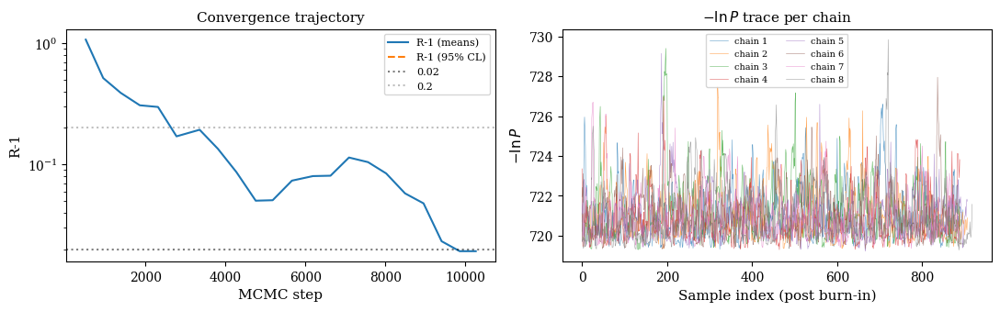


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  exo_bg
──────────────────────────────────────────────────────────────────────
                    block         chi2
            BAO   [group]       11.718
             H0   [group]        7.604
             SN   [group]     1404.872
             H0.riess2020        7.604
          sn.pantheonplus     1404.872
             bao.desi_dr2       11.718
—  TOTAL (leaves only)  —     1424.194

  -lnP at chain-MAP : 719.2208


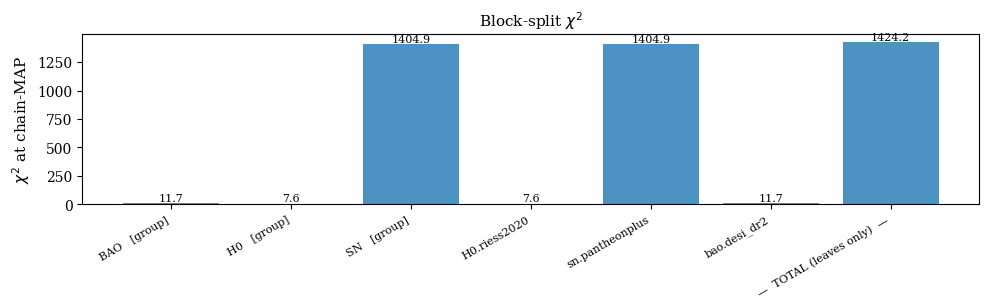


══════════════════════════════════════════════════════════════════════
  RUN: exo_bg_cmb
  model=exotic    shmr=None    zcut=None    data=bg_cmb
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  exo_bg_cmb
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 29735
  Weighted samples  : 81056.0
  Cobaya  R-1  (last progress)  : 0.01571
  Cobaya  R-1 (95% CL, last)    : 0.1005
  getdist R-1 (max all params)  : 0.009562    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
          a_samp      40.06    2023.18
               s      39.62    2045.95
     theta_s_100      39.70    2041.60
         omega_b      36.53    2218.67
       omega_cdm      37.89    2139.21
        tau_reio      36.94    2194.02
            logA      36.71    2208.

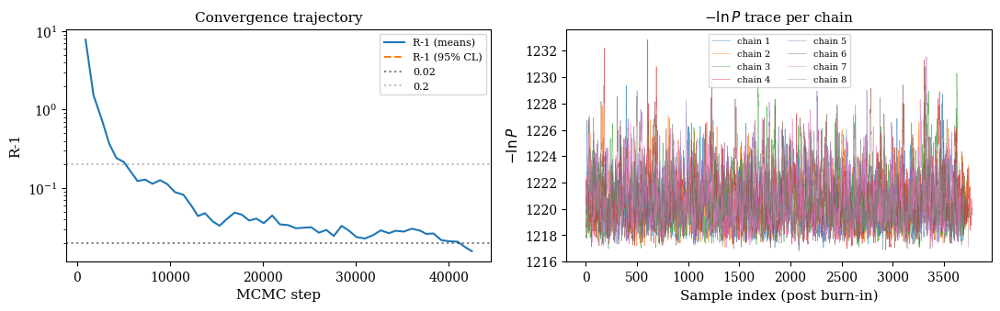


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  exo_bg_cmb
──────────────────────────────────────────────────────────────────────
                             block         chi2
                     BAO   [group]       10.457
                     CMB   [group]     1011.378
                      H0   [group]       11.117
                      SN   [group]     1405.936
                      H0.riess2020       11.117
                   sn.pantheonplus     1405.936
                      bao.desi_dr2       10.457
          planck_2018_lowl.TT_clik       23.722
          planck_2018_lowl.EE_clik      396.350
planck_2018_highl_plik.TTTEEE_lite      582.352
        planck_2018_lensing.native        8.954
         —  TOTAL (leaves only)  —     2438.887

  -lnP at chain-MAP : 1216.7942


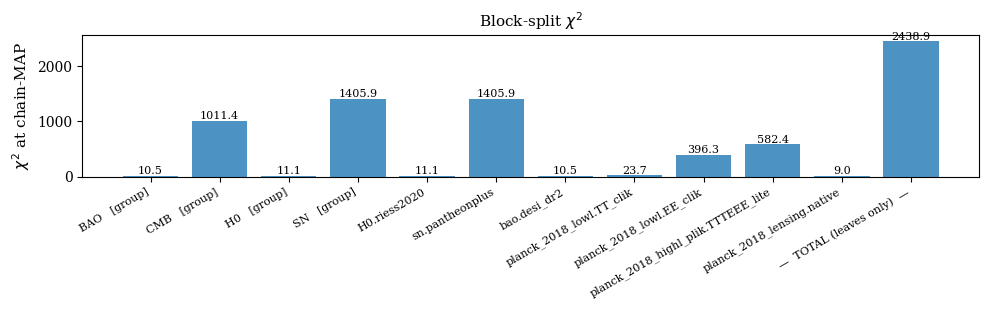


══════════════════════════════════════════════════════════════════════
  RUN: exo_uvlf_bg_cmb_fixed_full
  model=exotic    shmr=fixed   zcut=full    data=uvlf_bg_cmb
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  exo_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 16092
  Weighted samples  : 43305.0
  Cobaya  R-1  (last progress)  : 0.01715
  Cobaya  R-1 (95% CL, last)    : 0.1388
  getdist R-1 (max all params)  : 0.02329    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
          a_samp      42.84    1010.84
               s      39.89    1085.49
     theta_s_100      36.67    1180.86
         omega_b      36.36    1190.97
       omega_cdm      37.12    1166.73
        tau_reio      33.88    1278.07


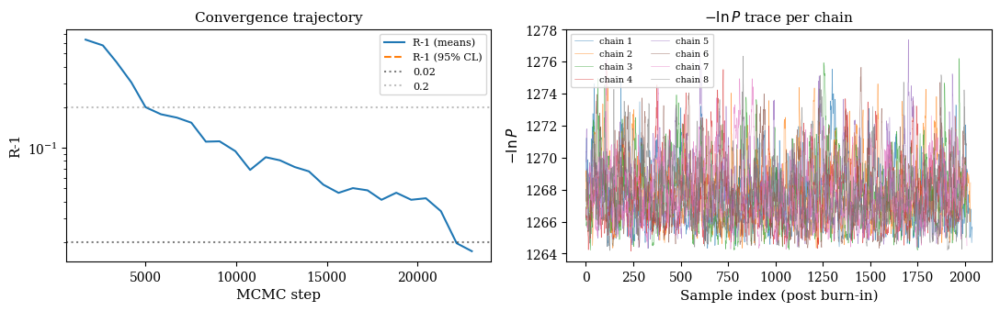


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  exo_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────
                              block         chi2
                      BAO   [group]       10.354
                      CMB   [group]     1013.189
                       H0   [group]       11.417
                       SN   [group]     1406.132
jwst_likelihood_uvlf.UVLFLikelihood       92.877
                       H0.riess2020       11.417
                    sn.pantheonplus     1406.132
                       bao.desi_dr2       10.354
           planck_2018_lowl.TT_clik       23.413
           planck_2018_lowl.EE_clik      395.836
 planck_2018_highl_plik.TTTEEE_lite      584.755
         planck_2018_lensing.native        9.185
          —  TOTAL (leaves only)  —     2533.968

  -lnP at chain-MAP : 1264.1530


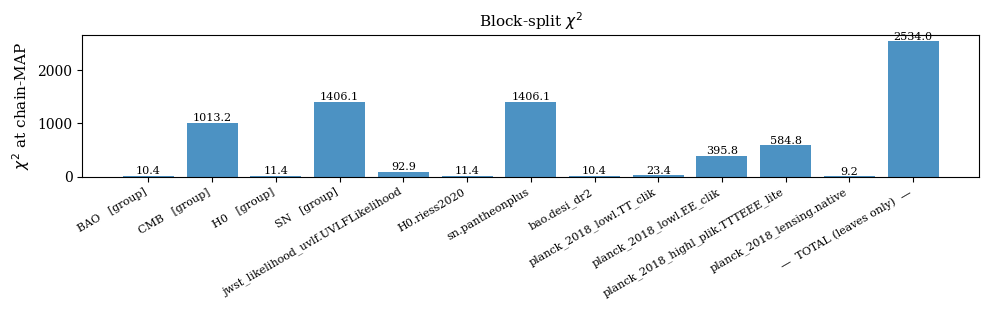


══════════════════════════════════════════════════════════════════════
  RUN: exo_uvlf_bg_cmb_vshmr_full
  model=exotic    shmr=vshmr   zcut=full    data=uvlf_bg_cmb
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  exo_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 45883
  Weighted samples  : 146780.0
  Cobaya  R-1  (last progress)  : 0.01905
  Cobaya  R-1 (95% CL, last)    : 0.1118
  getdist R-1 (max all params)  : 0.01192    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
          a_samp      60.74    2416.64
               s      59.05    2485.62
     theta_s_100      59.58    2463.56
         omega_b      57.08    2571.57
       omega_cdm      60.24    2436.67
        tau_reio      55.46    2646.39

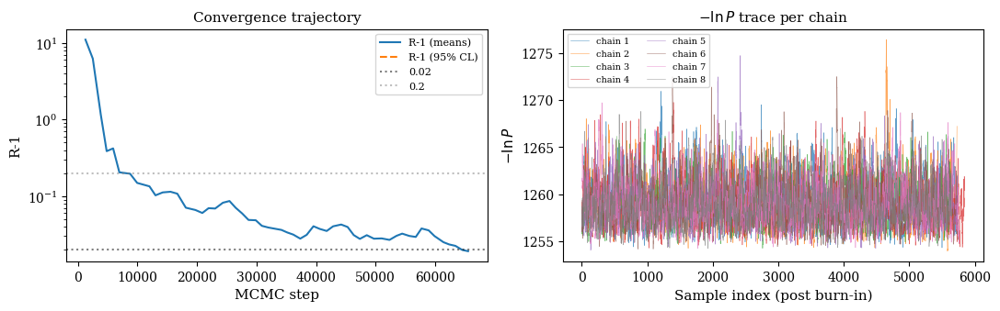


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  exo_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────
                              block         chi2
                      BAO   [group]       11.074
                      CMB   [group]     1012.366
                       H0   [group]        9.854
                       SN   [group]     1406.319
jwst_likelihood_uvlf.UVLFLikelihood       82.283
                       H0.riess2020        9.854
                    sn.pantheonplus     1406.319
                       bao.desi_dr2       11.074
           planck_2018_lowl.TT_clik       23.833
           planck_2018_lowl.EE_clik      396.242
 planck_2018_highl_plik.TTTEEE_lite      583.208
         planck_2018_lensing.native        9.083
          —  TOTAL (leaves only)  —     2521.895

  -lnP at chain-MAP : 1253.9444


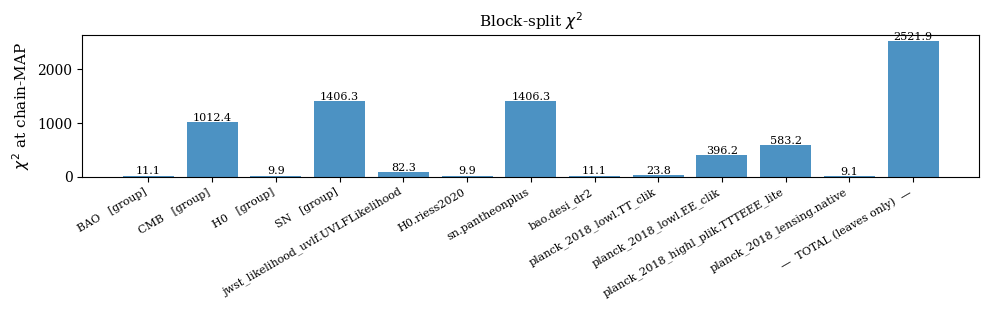


══════════════════════════════════════════════════════════════════════
  RUN: exo_uvlf_bg_fixed_full
  model=exotic    shmr=fixed   zcut=full    data=uvlf_bg
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  exo_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 9670
  Weighted samples  : 26093.0
  Cobaya  R-1  (last progress)  : 0.01848
  Cobaya  R-1 (95% CL, last)    : 0.1837
  getdist R-1 (max all params)  : 0.01209    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
          a_samp      23.67    1102.26
               s      25.63    1018.05
              H0      27.24     957.86
         omega_b      24.50    1064.92
       omega_cdm      25.25    1033.30
           a_exo      23.67    1102.26
           b_

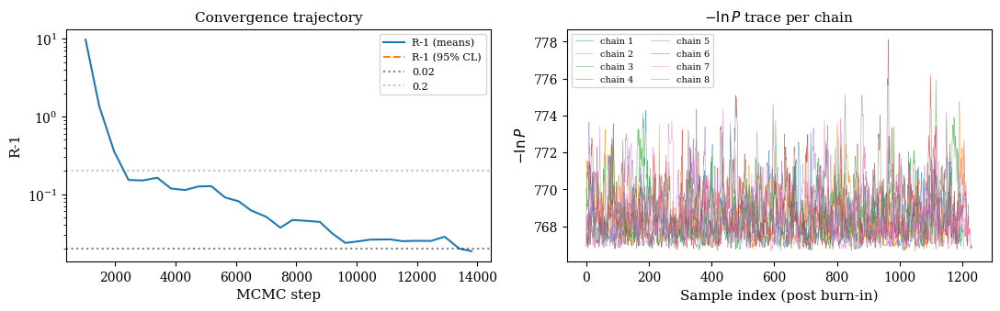


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  exo_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────
                              block         chi2
                      BAO   [group]       10.553
                       H0   [group]       10.532
                       SN   [group]     1406.535
jwst_likelihood_uvlf.UVLFLikelihood       92.118
                       H0.riess2020       10.532
                    sn.pantheonplus     1406.535
                       bao.desi_dr2       10.553
          —  TOTAL (leaves only)  —     1519.738

  -lnP at chain-MAP : 766.6540


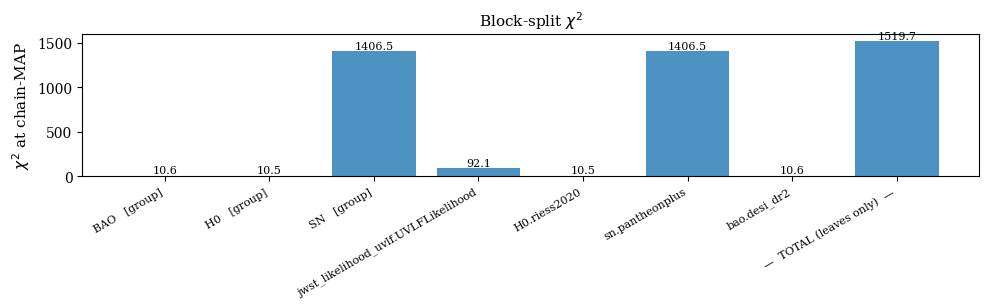


══════════════════════════════════════════════════════════════════════
  RUN: exo_uvlf_fixed_full
  model=exotic    shmr=fixed   zcut=full    data=uvlf
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  exo_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 19322
  Weighted samples  : 94305.0
  Cobaya  R-1  (last progress)  : 0.01714
  Cobaya  R-1 (95% CL, last)    : 0.1097
  getdist R-1 (max all params)  : 0.01075    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
       param    tau_int      N_eff
      a_samp      69.84    1350.37
           s      87.00    1084.02
          H0      81.67    1154.72
     omega_b      71.64    1316.33
   omega_cdm      74.24    1270.33
       a_exo      69.84    1350.37
       b_exo      69.74    1352.32
    Omega_x0  

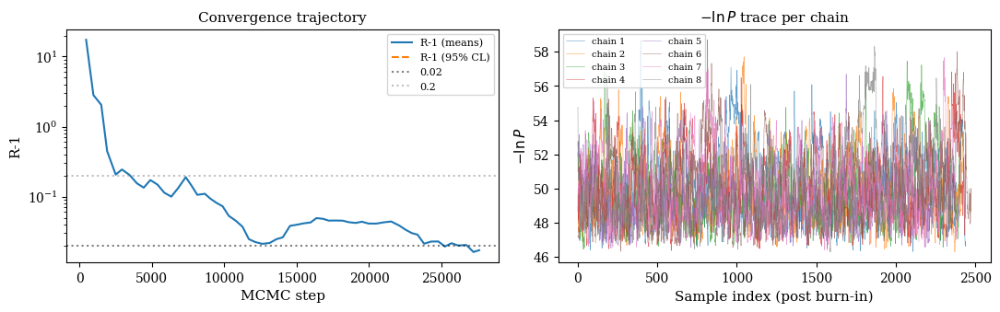


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  exo_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────
                              block         chi2
jwst_likelihood_uvlf.UVLFLikelihood       73.529
          —  TOTAL (leaves only)  —       73.529

  -lnP at chain-MAP : 46.2861


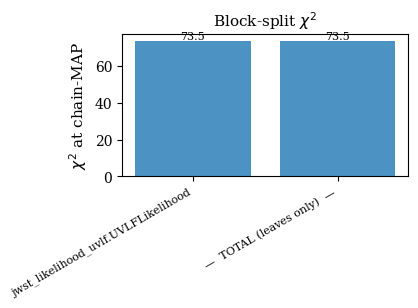


══════════════════════════════════════════════════════════════════════
  RUN: exo_uvlf_vshmr_restr
  model=exotic    shmr=vshmr   zcut=restr   data=uvlf
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  exo_uvlf_vshmr_restr
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 39298
  Weighted samples  : 200692.0
  Cobaya  R-1  (last progress)  : 0.01702
  Cobaya  R-1 (95% CL, last)    : 0.1231
  getdist R-1 (max all params)  : 0.01534    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
          a_samp     109.00    1841.19
               s     139.17    1442.03
              H0     142.99    1403.50
         omega_b     119.10    1685.06
       omega_cdm     138.89    1445.01
     shmr_log_Mc      95.43    2102.98
          shmr_N  

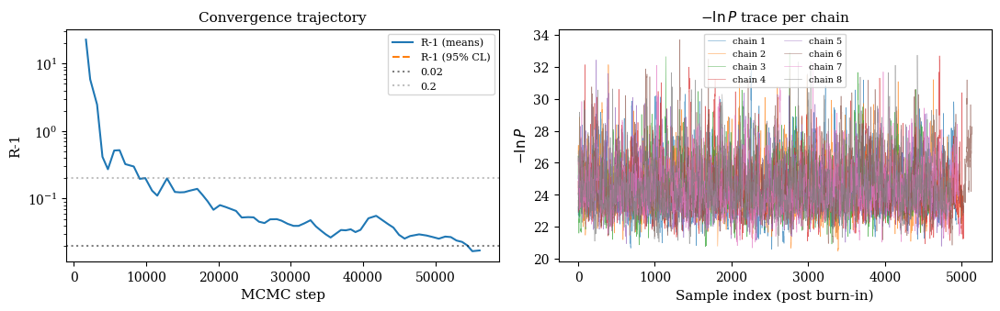


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  exo_uvlf_vshmr_restr
──────────────────────────────────────────────────────────────────────
                              block         chi2
jwst_likelihood_uvlf.UVLFLikelihood       31.919
          —  TOTAL (leaves only)  —       31.919

  -lnP at chain-MAP : 20.4801


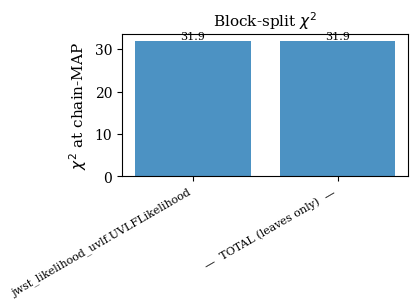


══════════════════════════════════════════════════════════════════════
  RUN: lcdm_bg
  model=lcdm      shmr=None    zcut=None    data=bg
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  lcdm_bg
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 4739
  Weighted samples  : 11076.0
  Cobaya  R-1  (last progress)  : 0.01371
  Cobaya  R-1 (95% CL, last)    : 0.1212
  getdist R-1 (max all params)  : 0.02351    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
              H0      12.47     887.92
         omega_b      10.82    1023.51
       omega_cdm      11.45     967.10
         Omega_m      11.19     989.97
    Omega_Lambda      11.19     989.97
          sigma8      11.40     971.73
         Omega_b       9.48    1168.58
       Om

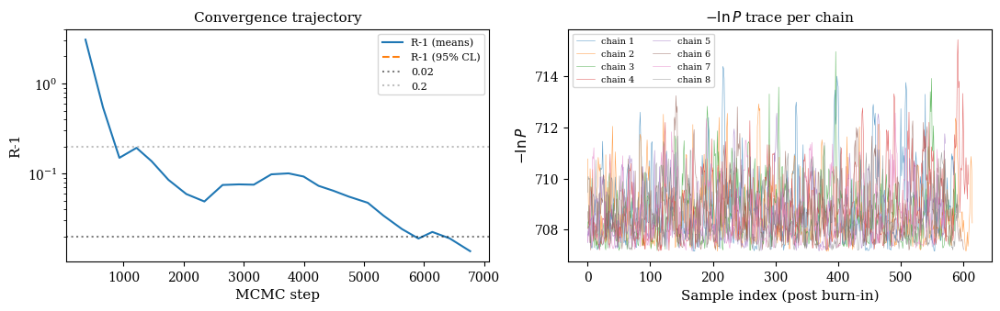


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  lcdm_bg
──────────────────────────────────────────────────────────────────────
                    block         chi2
            BAO   [group]       11.937
             H0   [group]        8.915
             SN   [group]     1404.995
             H0.riess2020        8.915
          sn.pantheonplus     1404.995
             bao.desi_dr2       11.937
—  TOTAL (leaves only)  —     1425.847

  -lnP at chain-MAP : 707.1566


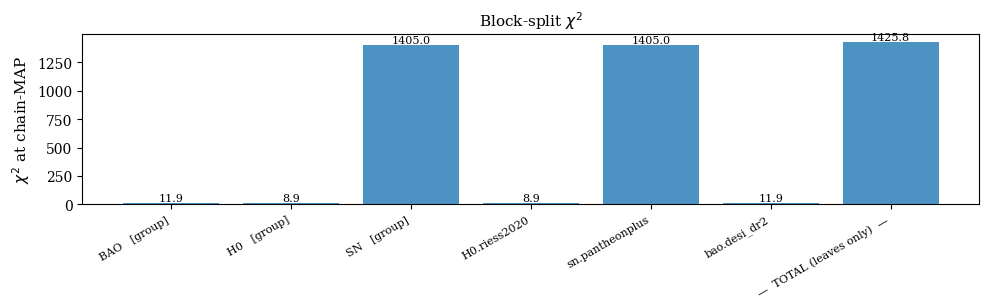


══════════════════════════════════════════════════════════════════════
  RUN: lcdm_bg_cmb
  model=lcdm      shmr=None    zcut=None    data=bg_cmb
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  lcdm_bg_cmb
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 17433
  Weighted samples  : 44610.0
  Cobaya  R-1  (last progress)  : 0.01864
  Cobaya  R-1 (95% CL, last)    : 0.09081
  getdist R-1 (max all params)  : 0.009253    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
     theta_s_100      26.35    1693.09
         omega_b      24.42    1826.61
       omega_cdm      23.02    1938.01
        tau_reio      24.30    1835.85
            logA      24.33    1833.19
             n_s      25.86    1724.81
        A_planck      26.54    16

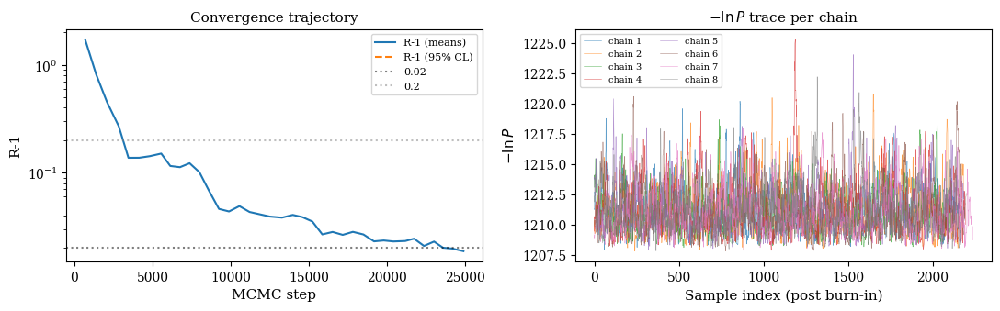


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  lcdm_bg_cmb
──────────────────────────────────────────────────────────────────────
                             block         chi2
                     BAO   [group]       11.887
                     CMB   [group]     1015.101
                      H0   [group]       13.709
                      SN   [group]     1405.805
                      H0.riess2020       13.709
                   sn.pantheonplus     1405.805
                      bao.desi_dr2       11.887
          planck_2018_lowl.TT_clik       22.629
          planck_2018_lowl.EE_clik      397.078
planck_2018_highl_plik.TTTEEE_lite      586.165
        planck_2018_lensing.native        9.230
         —  TOTAL (leaves only)  —     2446.502

  -lnP at chain-MAP : 1207.8197


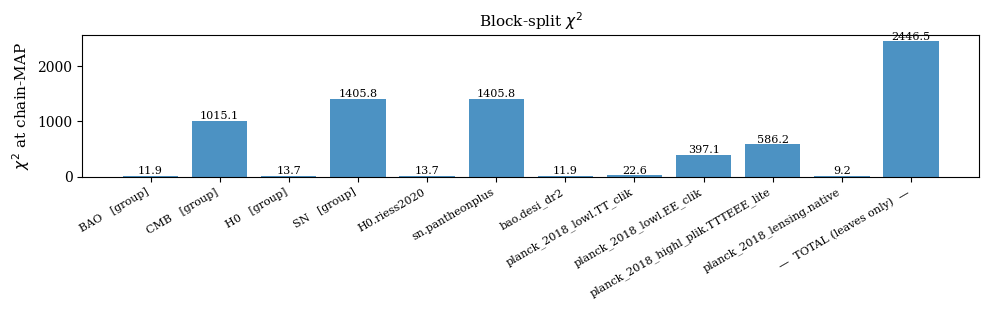


══════════════════════════════════════════════════════════════════════
  RUN: lcdm_primer_fixed_full
  model=lcdm      shmr=fixed   zcut=full    data=primer
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  lcdm_primer_fixed_full
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 6327
  Weighted samples  : 19121.0
  Cobaya  R-1  (last progress)  : 0.01757
  Cobaya  R-1 (95% CL, last)    : 0.1762
  getdist R-1 (max all params)  : 0.01697    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
       param    tau_int      N_eff
          H0      15.54    1230.39
     omega_b      16.04    1192.17
   omega_cdm      16.54    1156.38
     Omega_m      14.78    1293.63
Omega_Lambda      14.78    1293.62
      sigma8      15.09    1267.02
     Omega_b      14.31    1336.04
   Omeg

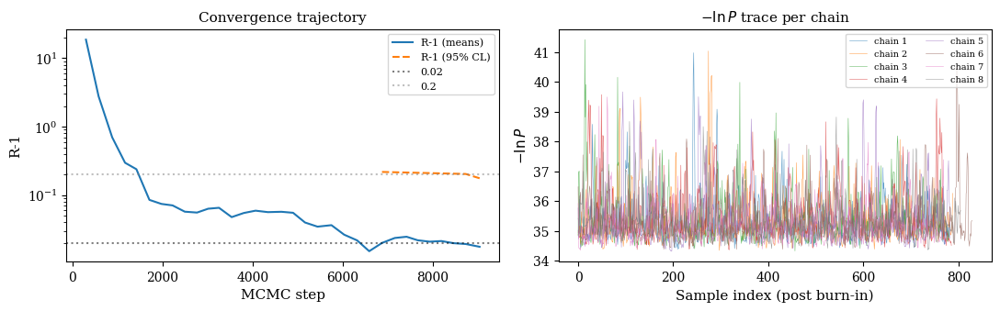


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  lcdm_primer_fixed_full
──────────────────────────────────────────────────────────────────────
                              block         chi2
jwst_likelihood_uvlf.UVLFLikelihood       75.119
          —  TOTAL (leaves only)  —       75.119

  -lnP at chain-MAP : 34.3154


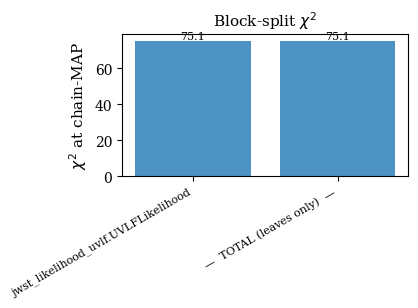


══════════════════════════════════════════════════════════════════════
  RUN: lcdm_uvlf_bg_cmb_fixed_full
  model=lcdm      shmr=fixed   zcut=full    data=uvlf_bg_cmb
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  lcdm_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 18168
  Weighted samples  : 45862.0
  Cobaya  R-1  (last progress)  : 0.01882
  Cobaya  R-1 (95% CL, last)    : 0.09709
  getdist R-1 (max all params)  : 0.01361    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
     theta_s_100      24.02    1909.63
         omega_b      25.38    1806.78
       omega_cdm      24.22    1893.46
        tau_reio      24.41    1879.13
            logA      23.30    1968.06
             n_s      25.68    1786.

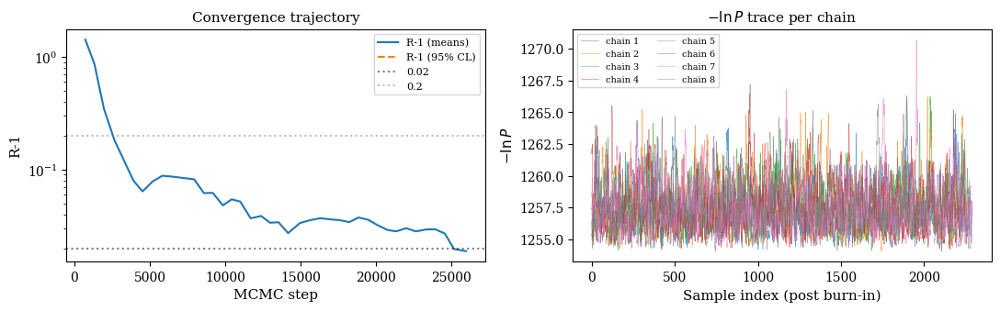


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  lcdm_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────
                              block         chi2
                      BAO   [group]       11.046
                      CMB   [group]     1016.273
                       H0   [group]       12.910
                       SN   [group]     1406.141
jwst_likelihood_uvlf.UVLFLikelihood       92.344
                       H0.riess2020       12.910
                    sn.pantheonplus     1406.141
                       bao.desi_dr2       11.046
           planck_2018_lowl.TT_clik       22.518
           planck_2018_lowl.EE_clik      398.872
 planck_2018_highl_plik.TTTEEE_lite      586.042
         planck_2018_lensing.native        8.842
          —  TOTAL (leaves only)  —     2538.713

  -lnP at chain-MAP : 1254.0539


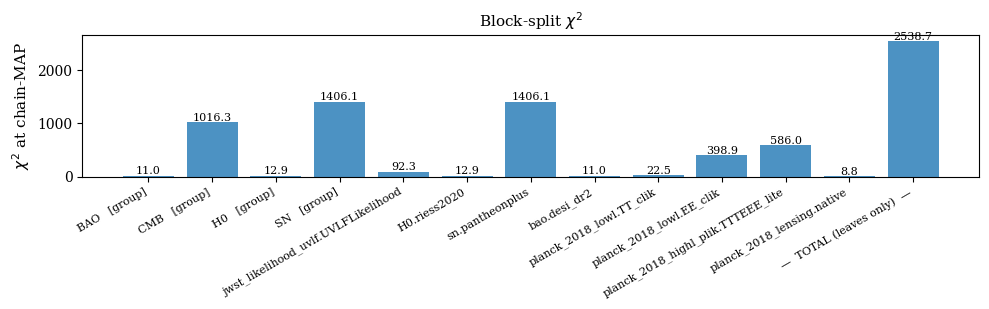


══════════════════════════════════════════════════════════════════════
  RUN: lcdm_uvlf_bg_cmb_vbeta_full
  model=lcdm      shmr=vbeta   zcut=full    data=uvlf_bg_cmb
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  lcdm_uvlf_bg_cmb_vbeta_full
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 22848
  Weighted samples  : 71201.0
  Cobaya  R-1  (last progress)  : 0.01857
  Cobaya  R-1 (95% CL, last)    : 0.1361
  getdist R-1 (max all params)  : 0.0116    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
     theta_s_100      40.48    1759.03
         omega_b      43.06    1653.53
       omega_cdm      35.32    2016.00
        tau_reio      70.07    1016.21
            logA      62.25    1143.75
             n_s      48.44    1469.92

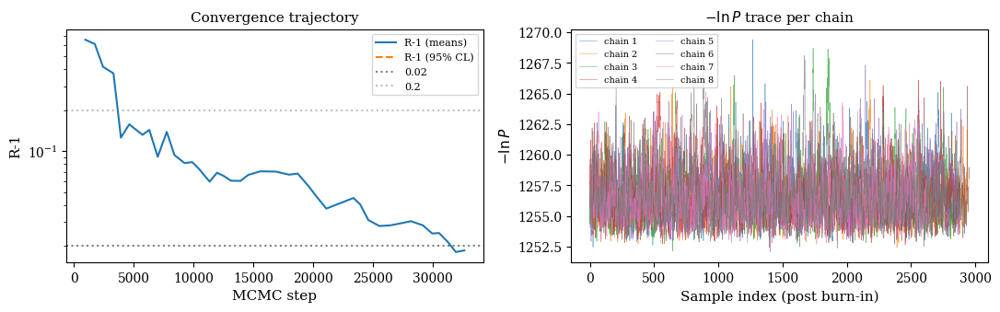


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  lcdm_uvlf_bg_cmb_vbeta_full
──────────────────────────────────────────────────────────────────────
                              block         chi2
                      BAO   [group]       11.383
                      CMB   [group]     1016.606
                       H0   [group]       13.172
                       SN   [group]     1406.070
jwst_likelihood_uvlf.UVLFLikelihood       87.319
                       H0.riess2020       13.172
                    sn.pantheonplus     1406.070
                       bao.desi_dr2       11.383
           planck_2018_lowl.TT_clik       22.487
           planck_2018_lowl.EE_clik      395.949
 planck_2018_highl_plik.TTTEEE_lite      588.176
         planck_2018_lensing.native        9.995
          —  TOTAL (leaves only)  —     2534.550

  -lnP at chain-MAP : 1252.0581


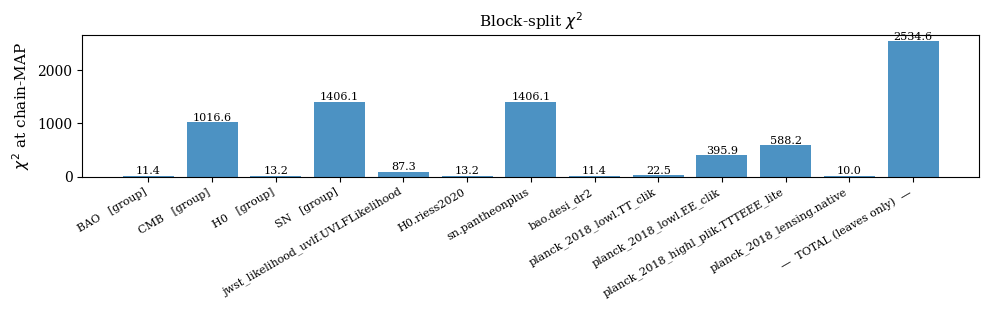


══════════════════════════════════════════════════════════════════════
  RUN: lcdm_uvlf_bg_cmb_vshmr_full
  model=lcdm      shmr=vshmr   zcut=full    data=uvlf_bg_cmb
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  lcdm_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 39465
  Weighted samples  : 132921.0
  Cobaya  R-1  (last progress)  : 0.01603
  Cobaya  R-1 (95% CL, last)    : 0.07464
  getdist R-1 (max all params)  : 0.01223    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
     theta_s_100      42.08    3158.97
         omega_b      42.50    3127.47
       omega_cdm      44.38    2995.19
        tau_reio      44.94    2957.79
            logA      43.70    3041.81
             n_s      49.34    2693

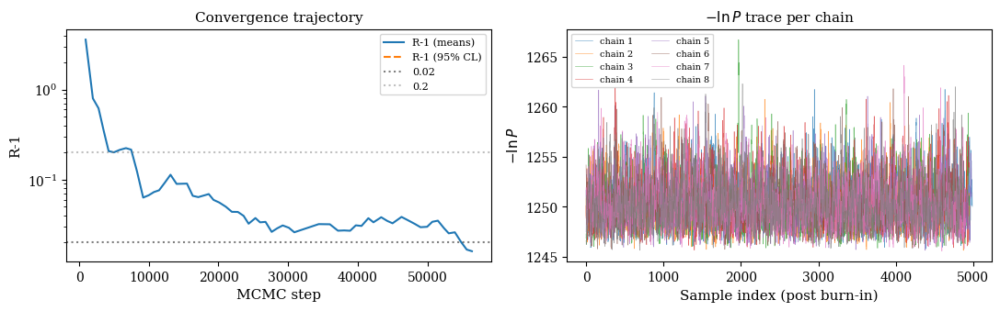


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  lcdm_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────
                              block         chi2
                      BAO   [group]       11.204
                      CMB   [group]     1016.040
                       H0   [group]       12.968
                       SN   [group]     1406.092
jwst_likelihood_uvlf.UVLFLikelihood       84.812
                       H0.riess2020       12.968
                    sn.pantheonplus     1406.092
                       bao.desi_dr2       11.204
           planck_2018_lowl.TT_clik       22.480
           planck_2018_lowl.EE_clik      398.278
 planck_2018_highl_plik.TTTEEE_lite      586.419
         planck_2018_lensing.native        8.862
          —  TOTAL (leaves only)  —     2531.116

  -lnP at chain-MAP : 1245.5490


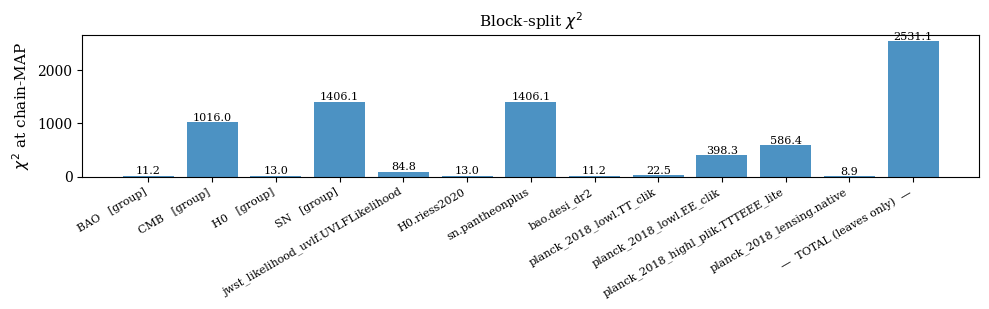


══════════════════════════════════════════════════════════════════════
  RUN: lcdm_uvlf_bg_cmb_vshmr_restr
  model=lcdm      shmr=vshmr   zcut=restr   data=uvlf_bg_cmb
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  lcdm_uvlf_bg_cmb_vshmr_restr
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 20452
  Weighted samples  : 65922.0
  Cobaya  R-1  (last progress)  : 0.01653
  Cobaya  R-1 (95% CL, last)    : 0.09674
  getdist R-1 (max all params)  : 0.01803    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
     theta_s_100      39.27    1678.65
         omega_b      37.04    1779.63
       omega_cdm      38.50    1712.05
        tau_reio      40.01    1647.83
            logA      39.70    1660.63
             n_s      38.72    170

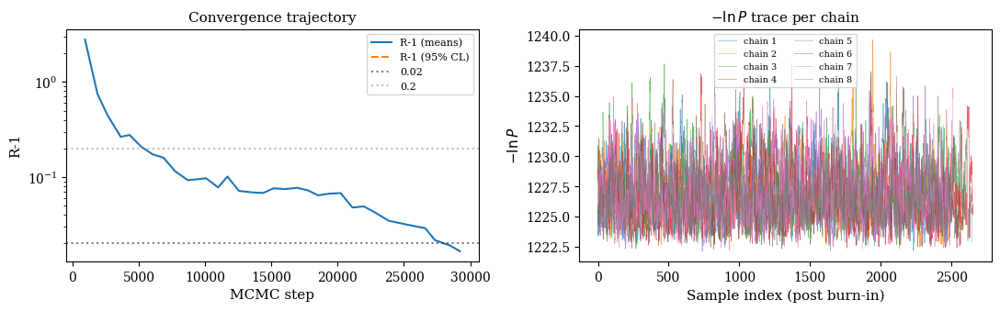


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  lcdm_uvlf_bg_cmb_vshmr_restr
──────────────────────────────────────────────────────────────────────
                              block         chi2
                      BAO   [group]       11.811
                      CMB   [group]     1016.106
                       H0   [group]       13.652
                       SN   [group]     1405.845
jwst_likelihood_uvlf.UVLFLikelihood       37.323
                       H0.riess2020       13.652
                    sn.pantheonplus     1405.845
                       bao.desi_dr2       11.811
           planck_2018_lowl.TT_clik       22.229
           planck_2018_lowl.EE_clik      398.586
 planck_2018_highl_plik.TTTEEE_lite      586.524
         planck_2018_lensing.native        8.767
          —  TOTAL (leaves only)  —     2484.737

  -lnP at chain-MAP : 1222.1546


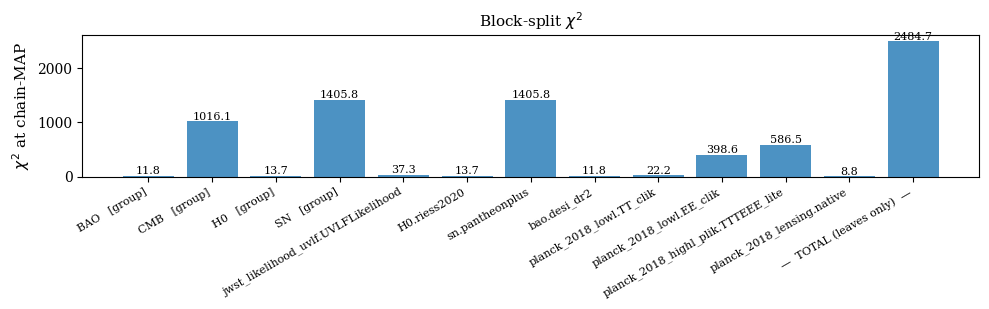


══════════════════════════════════════════════════════════════════════
  RUN: lcdm_uvlf_bg_fixed_full
  model=lcdm      shmr=fixed   zcut=full    data=uvlf_bg
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  lcdm_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 4913
  Weighted samples  : 11698.0
  Cobaya  R-1  (last progress)  : 0.01449
  Cobaya  R-1 (95% CL, last)    : 0.1417
  getdist R-1 (max all params)  : 0.01089    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
           param    tau_int      N_eff
              H0      13.92     840.60
         omega_b      11.81     990.47
       omega_cdm      11.34    1031.25
         Omega_m      13.69     854.31
    Omega_Lambda      13.69     854.28
          sigma8      11.93     980.30
         Om

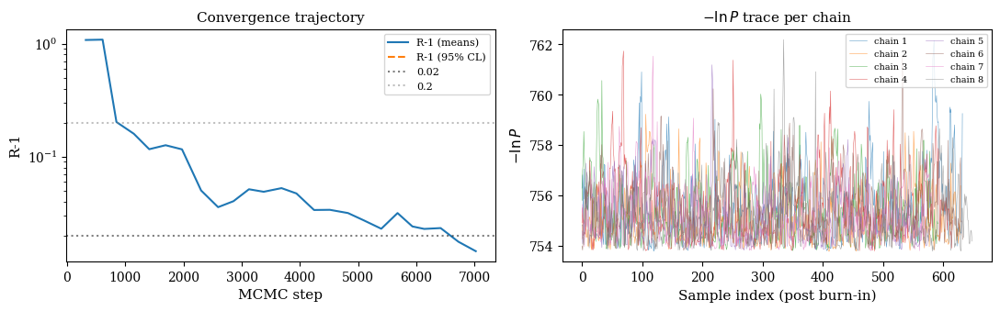


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  lcdm_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────
                              block         chi2
                      BAO   [group]       10.724
                       H0   [group]        9.672
                       SN   [group]     1406.137
jwst_likelihood_uvlf.UVLFLikelihood       92.555
                       H0.riess2020        9.672
                    sn.pantheonplus     1406.137
                       bao.desi_dr2       10.724
          —  TOTAL (leaves only)  —     1519.087

  -lnP at chain-MAP : 753.7962


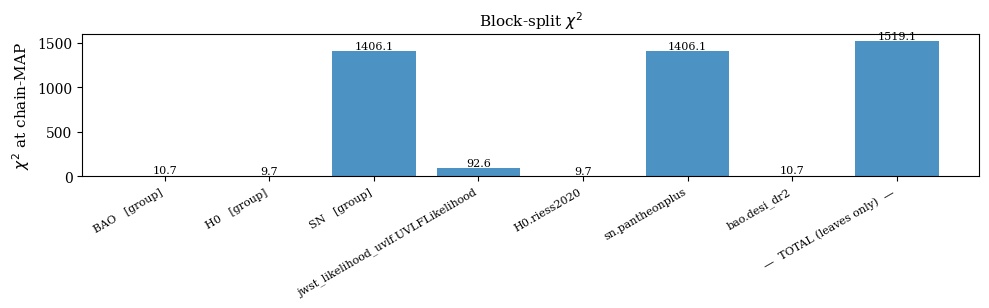


══════════════════════════════════════════════════════════════════════
  RUN: lcdm_uvlf_fixed_full
  model=lcdm      shmr=fixed   zcut=full    data=uvlf
══════════════════════════════════════════════════════════════════════

──────────────────────────────────────────────────────────────────────
§1 Chain Health  —  lcdm_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────
  Chains found      : 8
  Samples (rows)    : 4133
  Weighted samples  : 12396.0
  Cobaya  R-1  (last progress)  : 0.01126
  Cobaya  R-1 (95% CL, last)    : 0.1646
  getdist R-1 (max all params)  : 0.009123    [conservative; derived params included]

  Per-parameter autocorrelation length and ESS:
       param    tau_int      N_eff
          H0      16.29     760.73
     omega_b      15.82     783.48
   omega_cdm      15.93     778.21
     Omega_m      15.17     817.32
Omega_Lambda      15.17     817.32
      sigma8      15.48     800.81
     Omega_b      14.72     841.91
   Omega_cdm

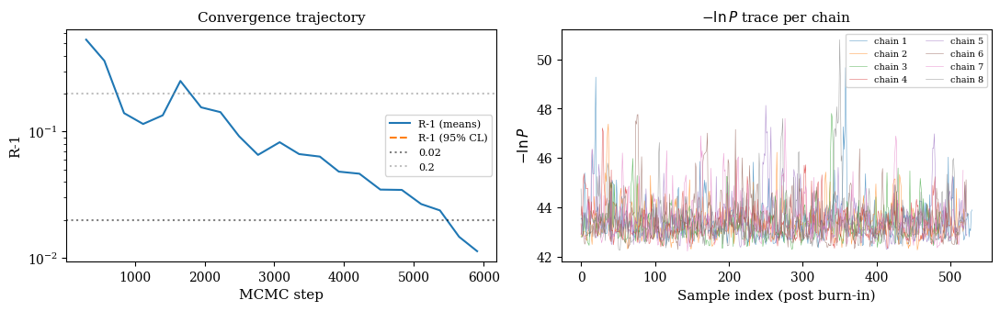


──────────────────────────────────────────────────────────────────────
§5 Goodness-of-Fit (chain-MAP)  —  lcdm_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────
                              block         chi2
jwst_likelihood_uvlf.UVLFLikelihood       90.939
          —  TOTAL (leaves only)  —       90.939

  -lnP at chain-MAP : 42.2254


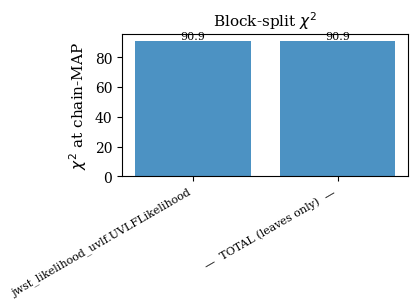


──────────────────────────────────────────────────────────────────────
§7 Cross-Run Tables (16 runs)
──────────────────────────────────────────────────────────────────────

  Posterior means:
run                exo_bg   exo_bg_cmb  exo_uvlf_bg_cmb_fixed_full  exo_uvlf_bg_cmb_vshmr_full  exo_uvlf_bg_fixed_full  exo_uvlf_fixed_full  exo_uvlf_vshmr_restr      lcdm_bg  lcdm_bg_cmb  lcdm_primer_fixed_full  lcdm_uvlf_bg_cmb_fixed_full  lcdm_uvlf_bg_cmb_vbeta_full  lcdm_uvlf_bg_cmb_vshmr_full  lcdm_uvlf_bg_cmb_vshmr_restr  lcdm_uvlf_bg_fixed_full  lcdm_uvlf_fixed_full
param                                                                                                                                                                                                                                                                                                                                                                                  
H0                  69.48        68.95                 

In [15]:
for r in runs_data:
    _run_banner(r)
    section1_chain_health(r)
    section5_gof(r)

if MODE_RESOLVED == "compare" and len(runs_data) >= 2:
    section7_cross_run_tables(runs_data)

print("\n" + "═"*70)
print("  Numbers loop complete.")
print("═"*70)


──── Plotting: exo_bg ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  exo_bg
──────────────────────────────────────────────────────────────────────


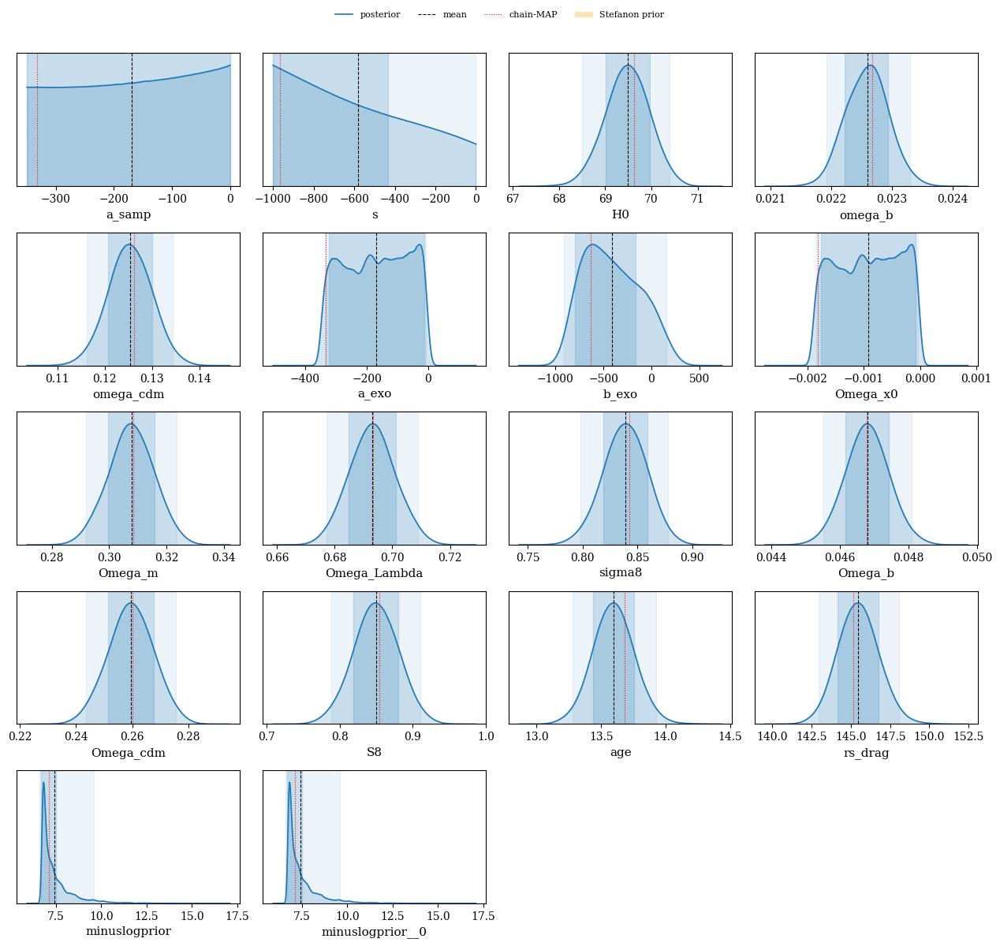


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  exo_bg
──────────────────────────────────────────────────────────────────────


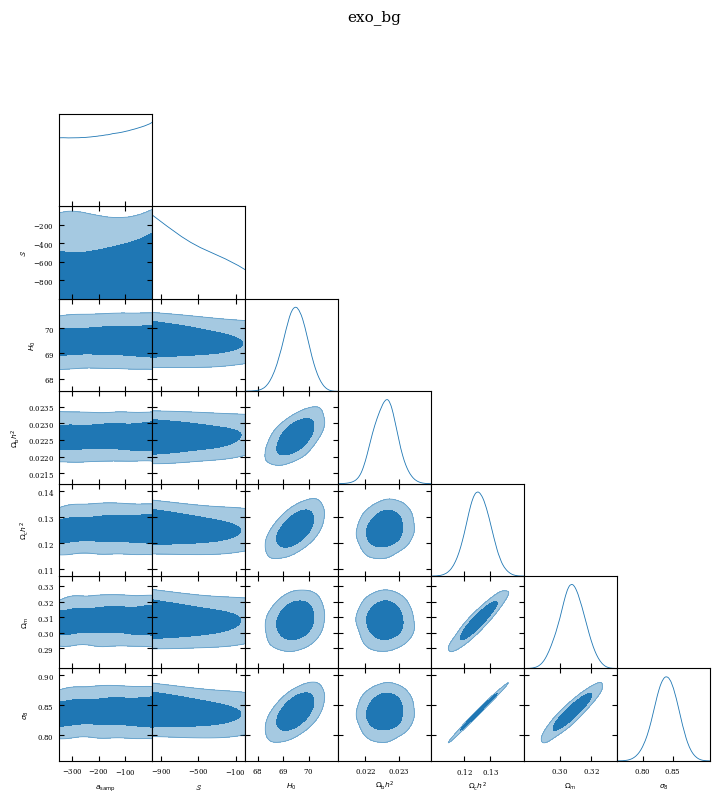


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  exo_bg
──────────────────────────────────────────────────────────────────────


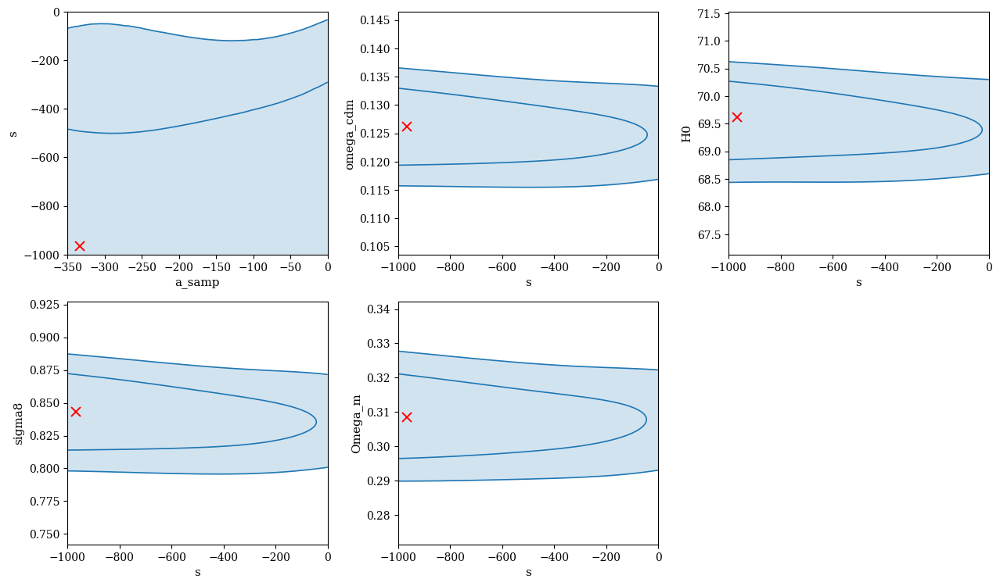


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  exo_bg
──────────────────────────────────────────────────────────────────────


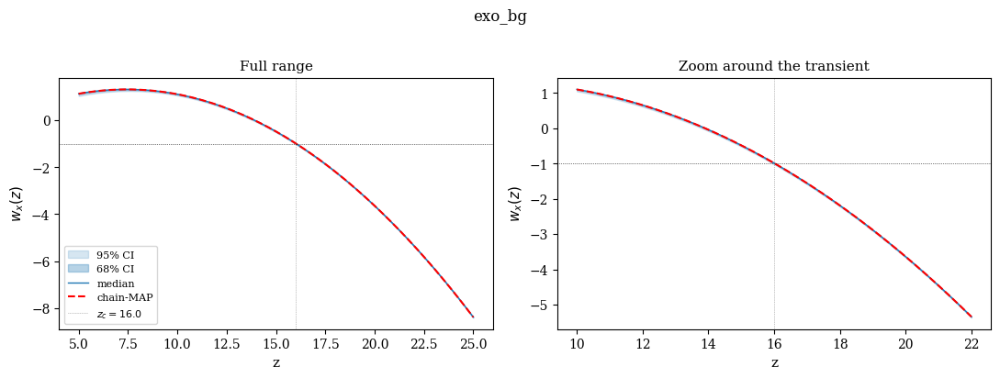


──── Plotting: exo_bg_cmb ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  exo_bg_cmb
──────────────────────────────────────────────────────────────────────


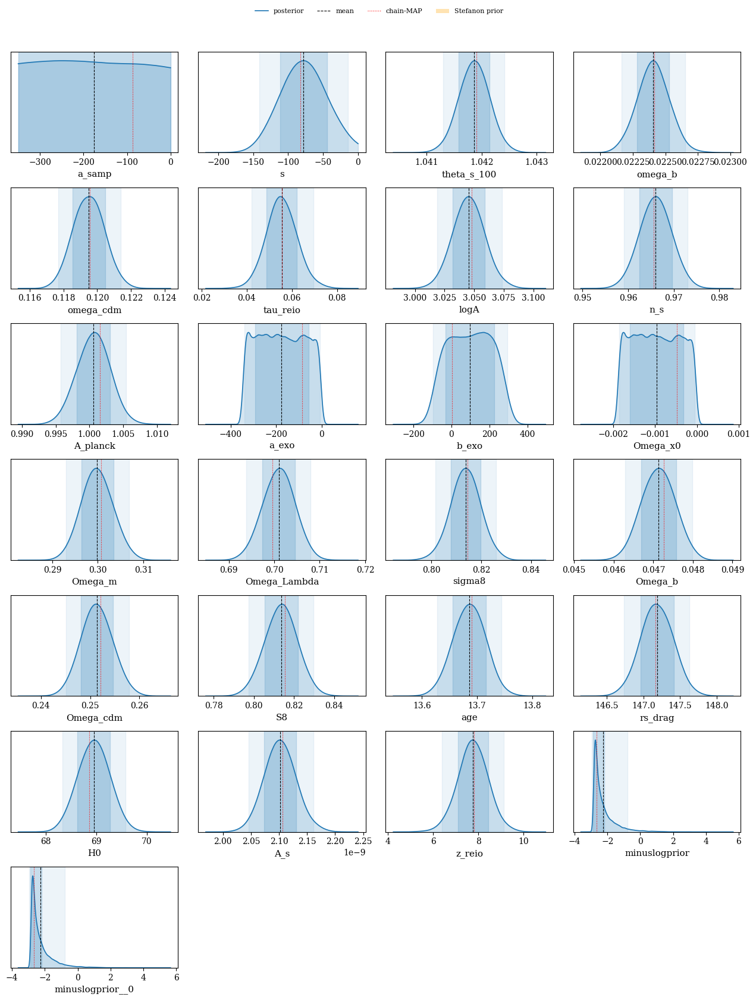


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  exo_bg_cmb
──────────────────────────────────────────────────────────────────────


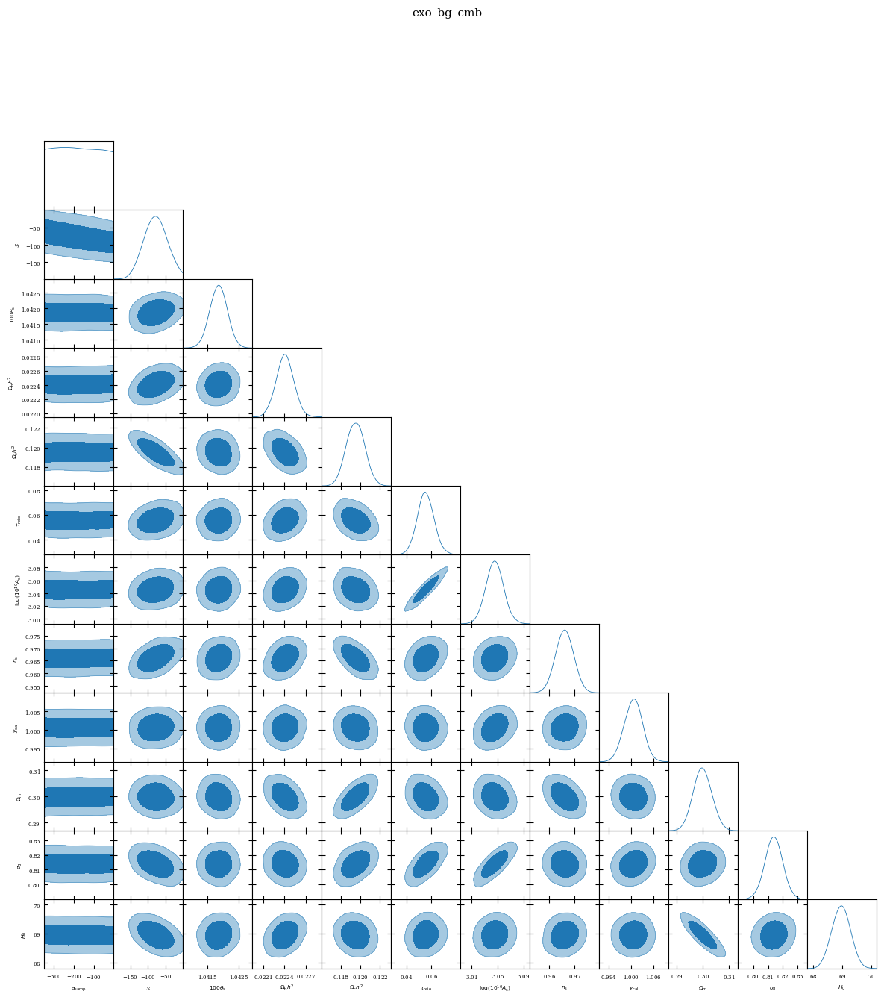


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  exo_bg_cmb
──────────────────────────────────────────────────────────────────────


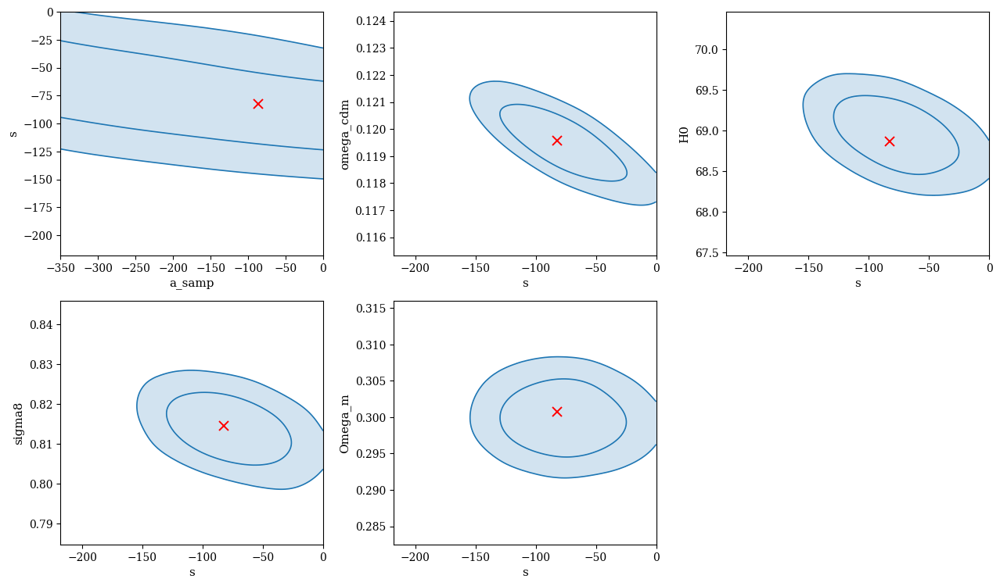


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  exo_bg_cmb
──────────────────────────────────────────────────────────────────────


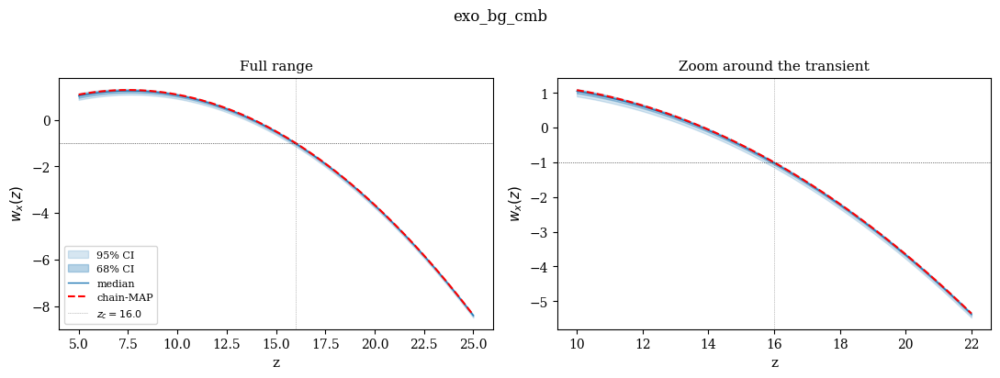


──── Plotting: exo_uvlf_bg_cmb_fixed_full ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  exo_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────


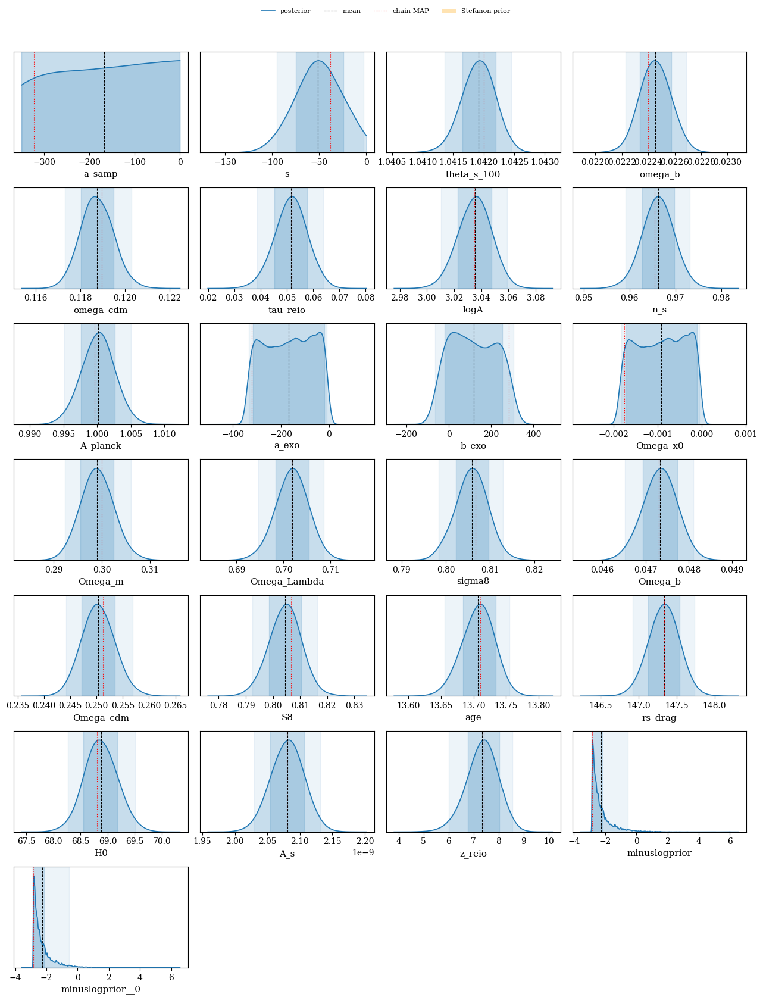


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  exo_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────


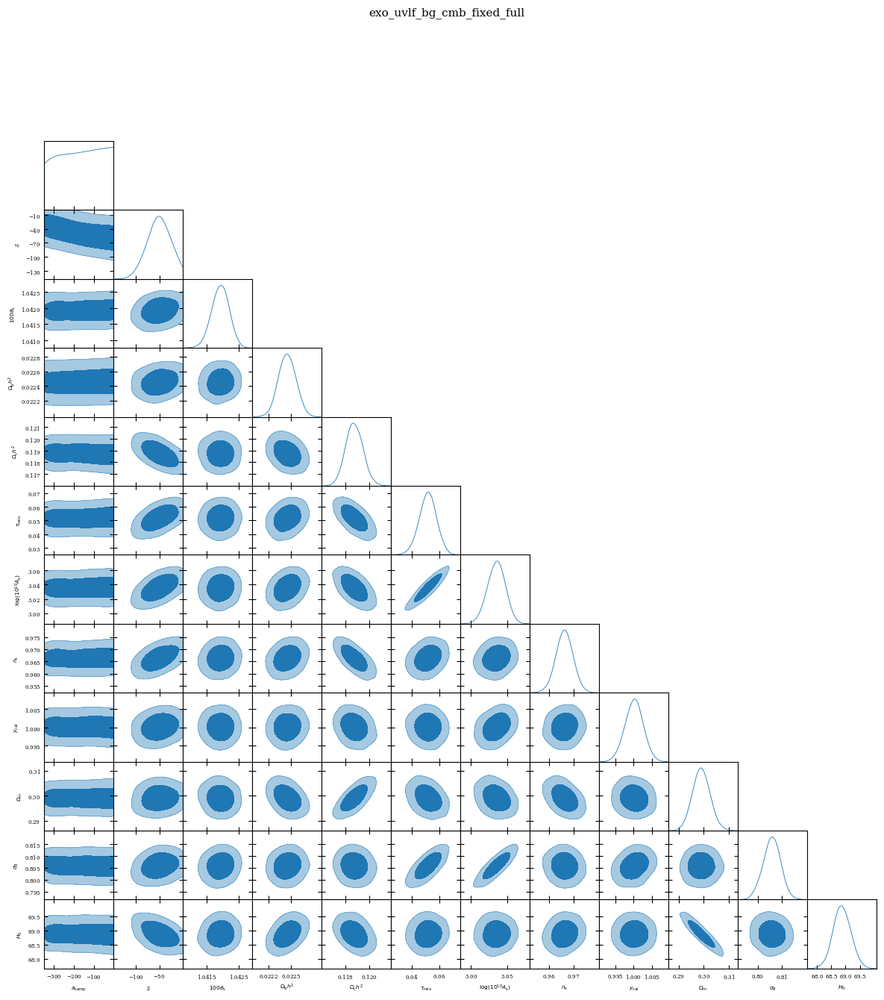


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  exo_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────


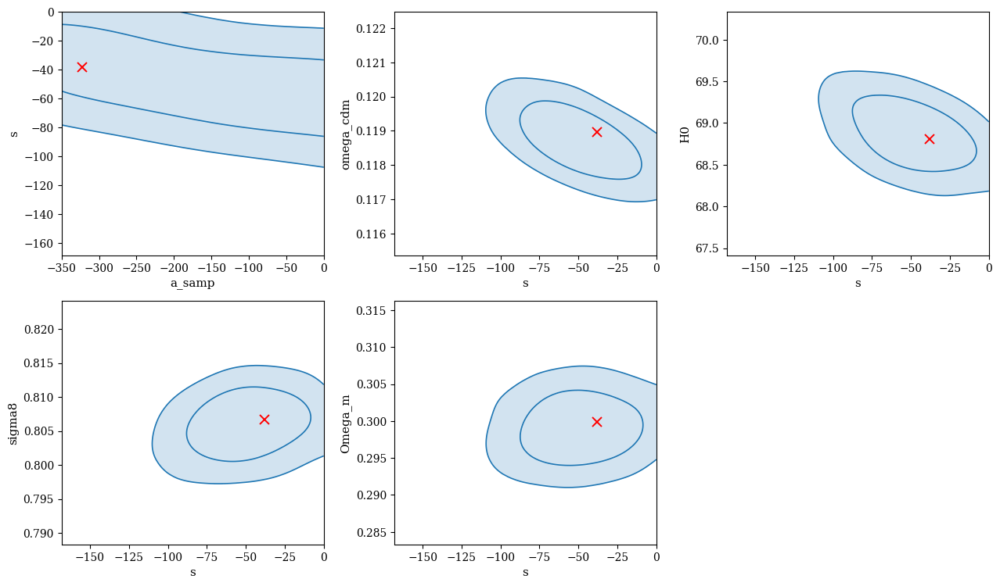


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  exo_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────


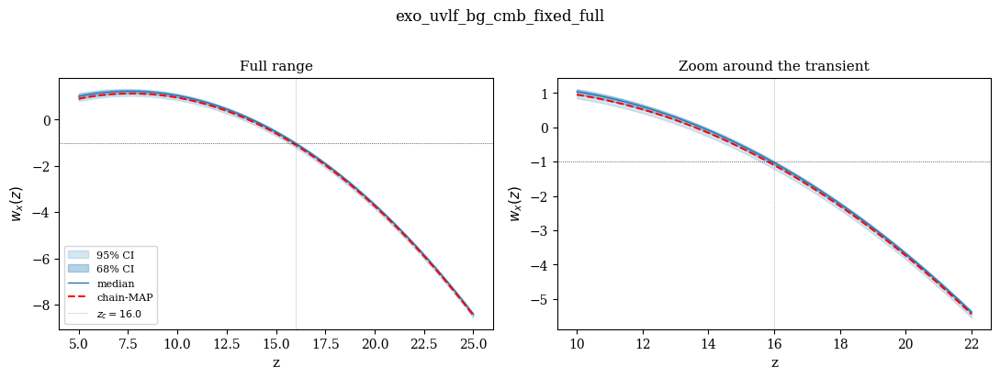


──── Plotting: exo_uvlf_bg_cmb_vshmr_full ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  exo_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────


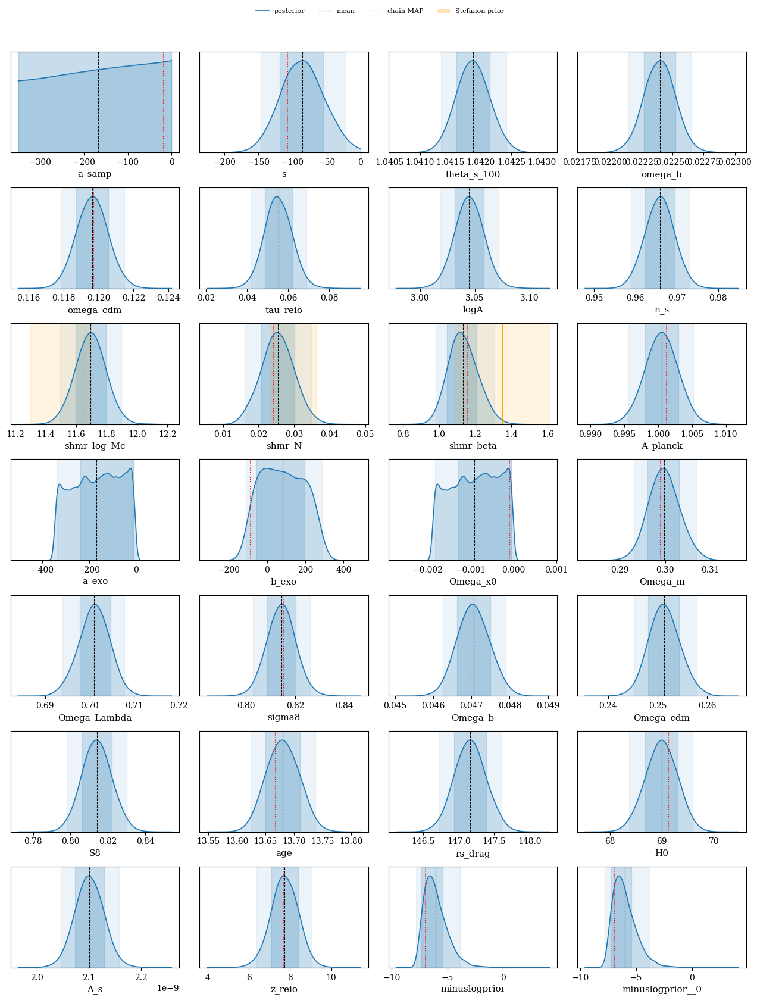


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  exo_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────


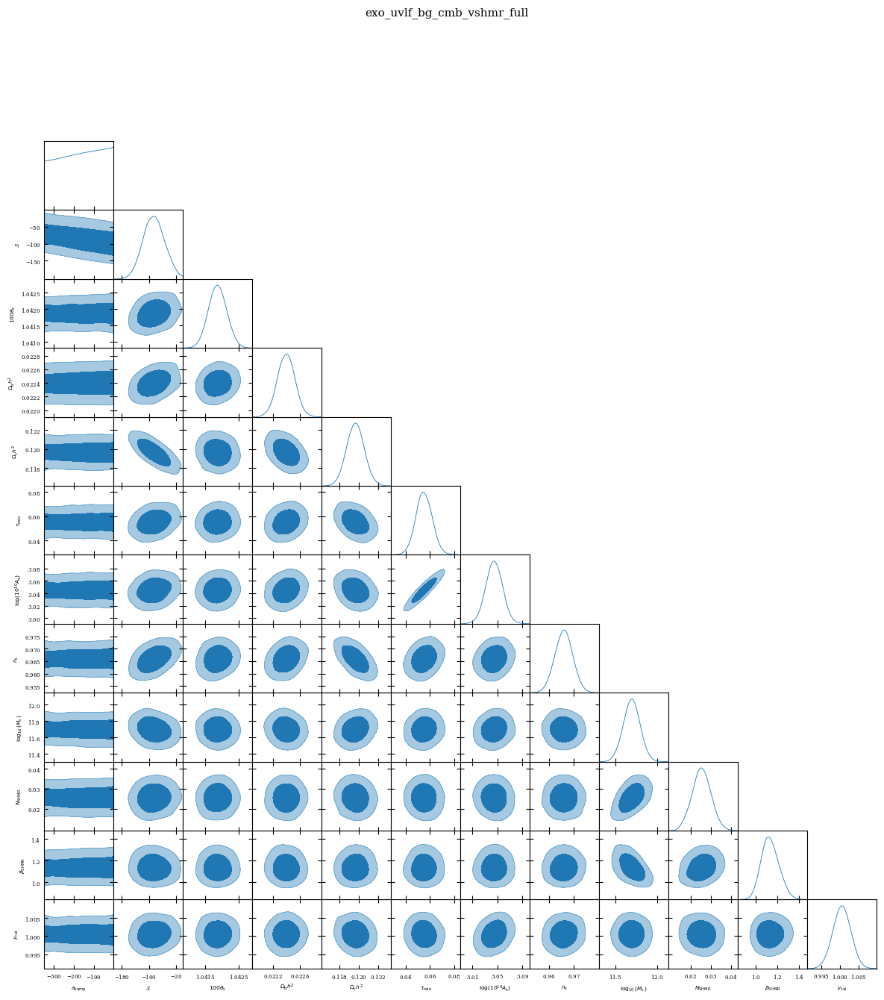


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  exo_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────


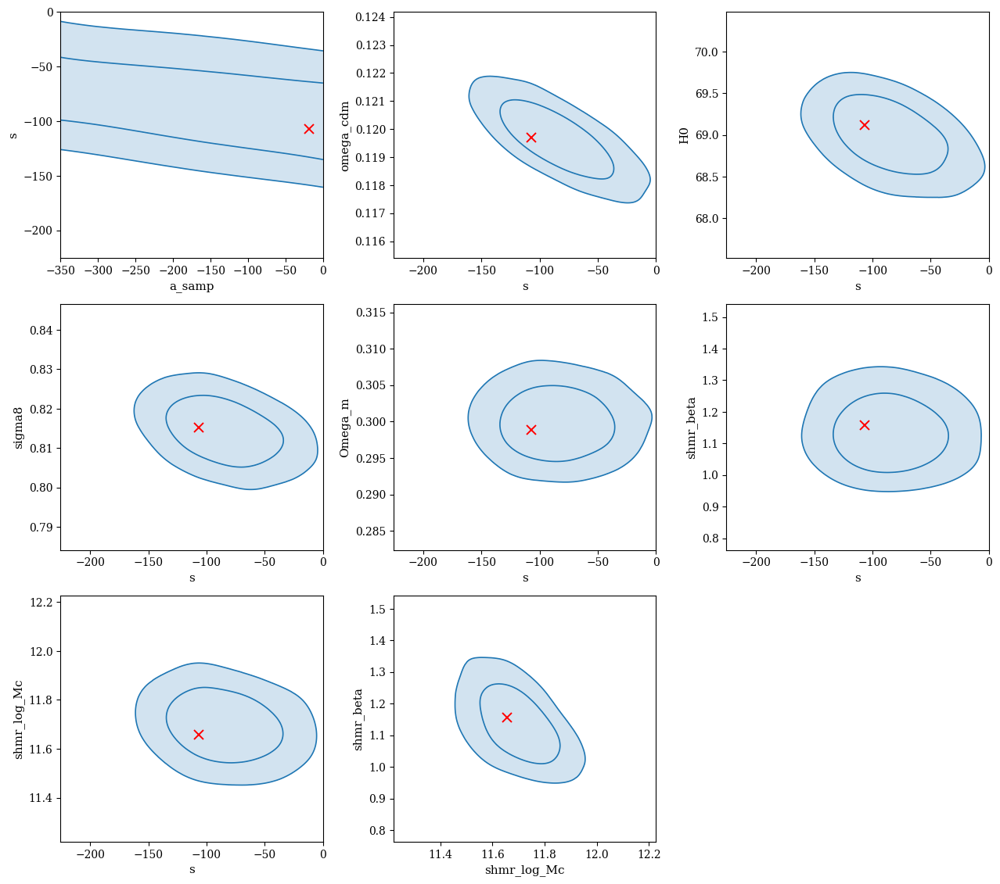


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  exo_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────


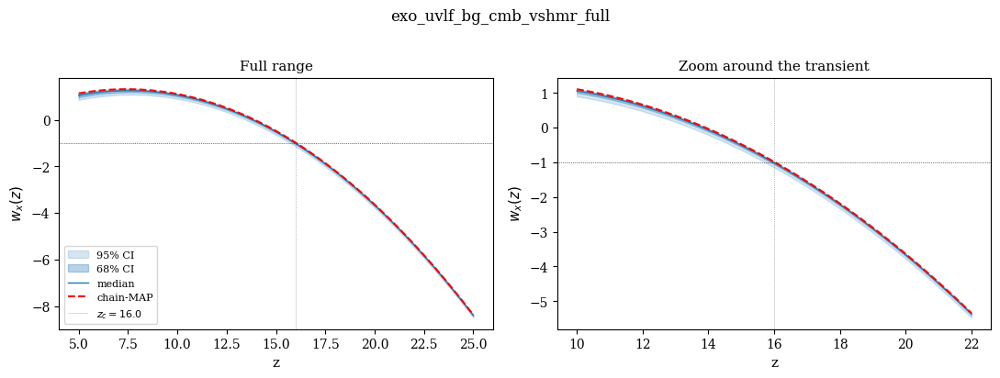


──── Plotting: exo_uvlf_bg_fixed_full ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  exo_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────


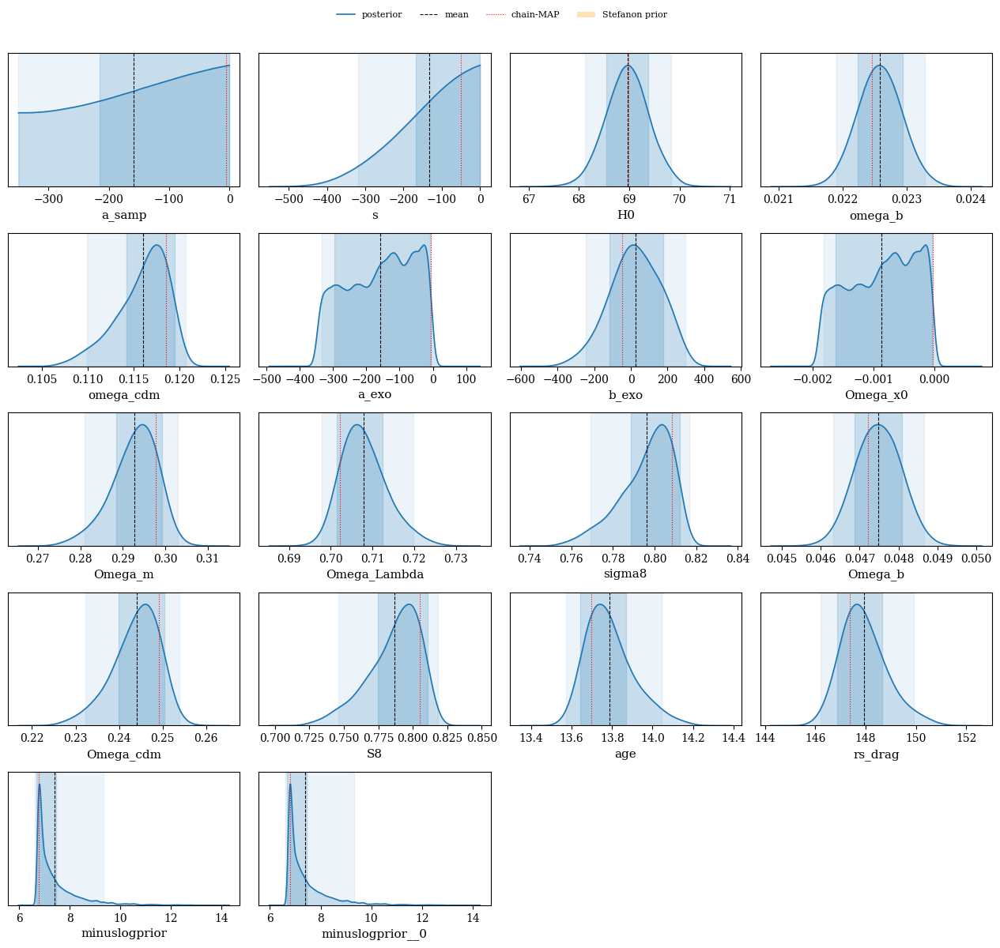


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  exo_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────


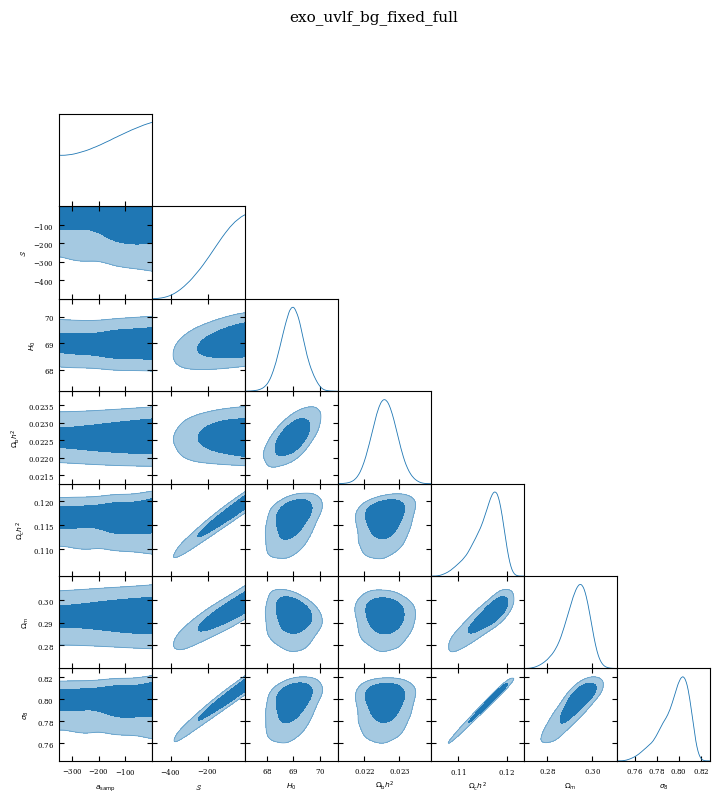


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  exo_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────


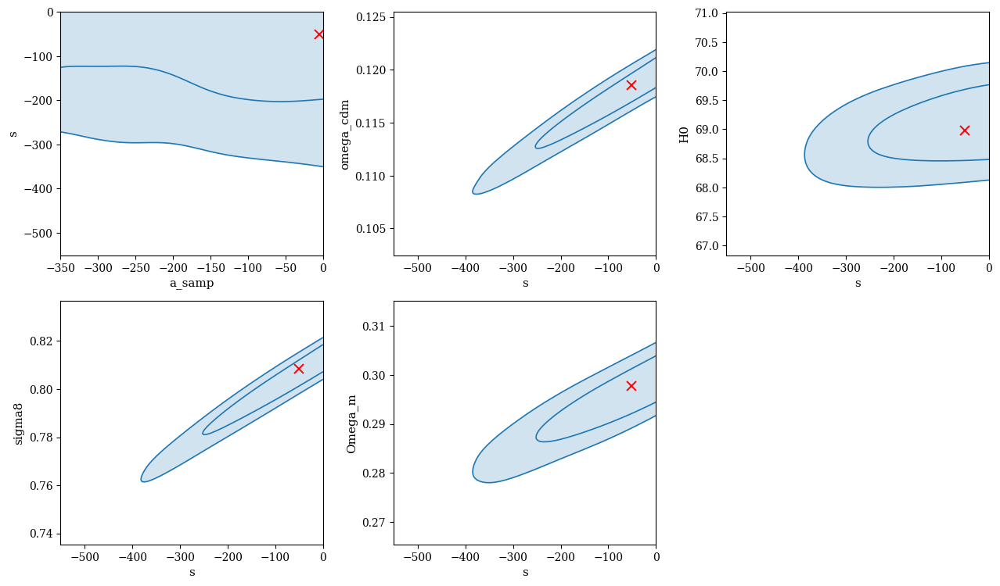


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  exo_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────


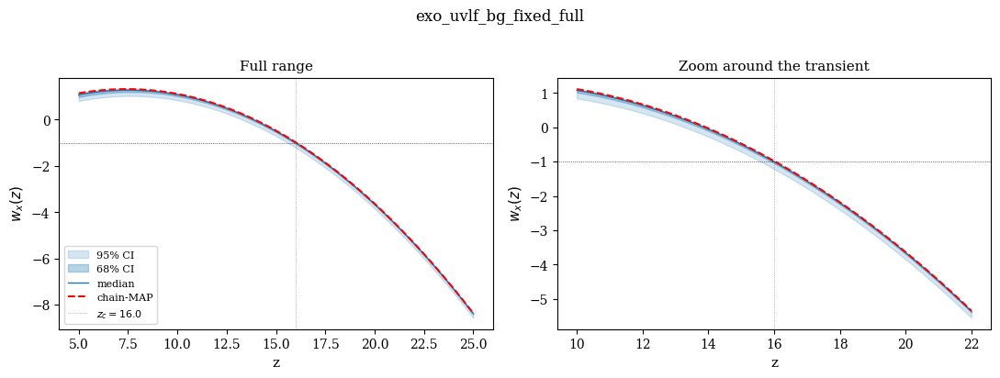


──── Plotting: exo_uvlf_fixed_full ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  exo_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────


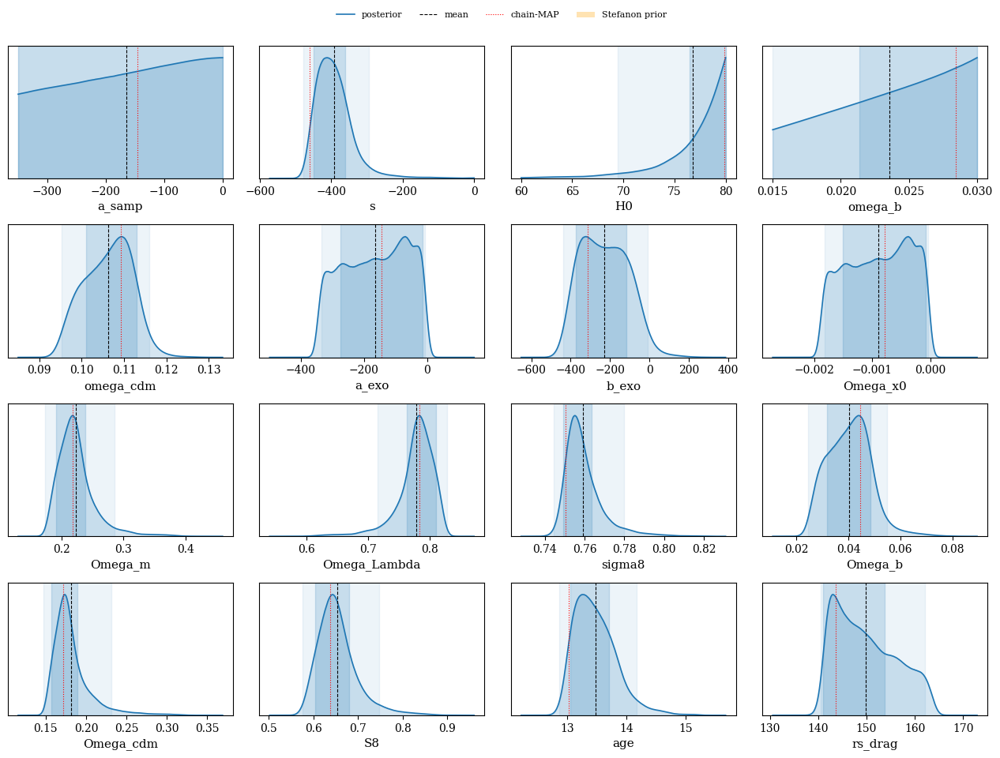


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  exo_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────


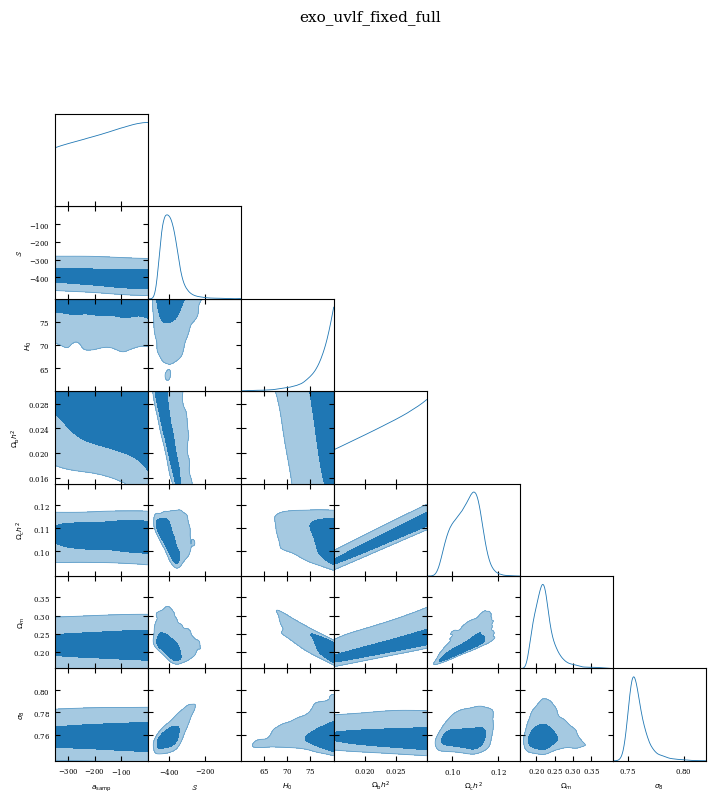


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  exo_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────


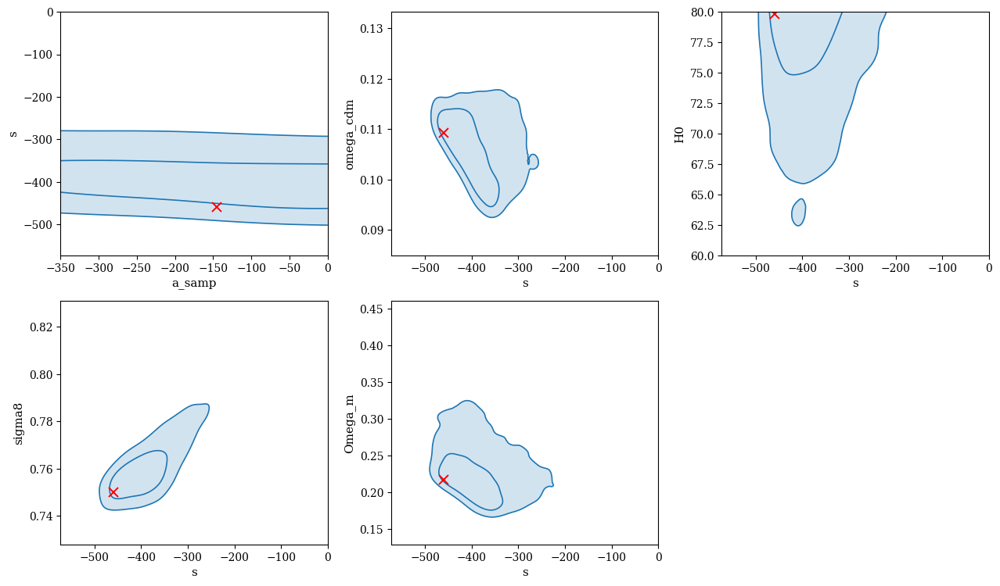


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  exo_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────


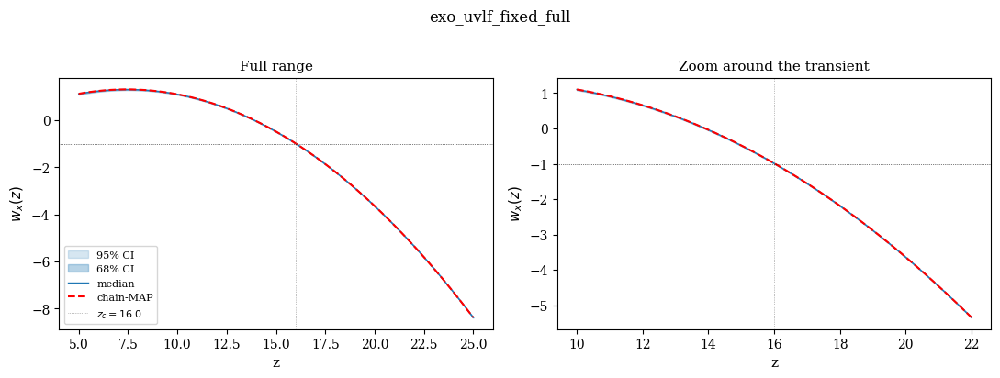


──── Plotting: exo_uvlf_vshmr_restr ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  exo_uvlf_vshmr_restr
──────────────────────────────────────────────────────────────────────


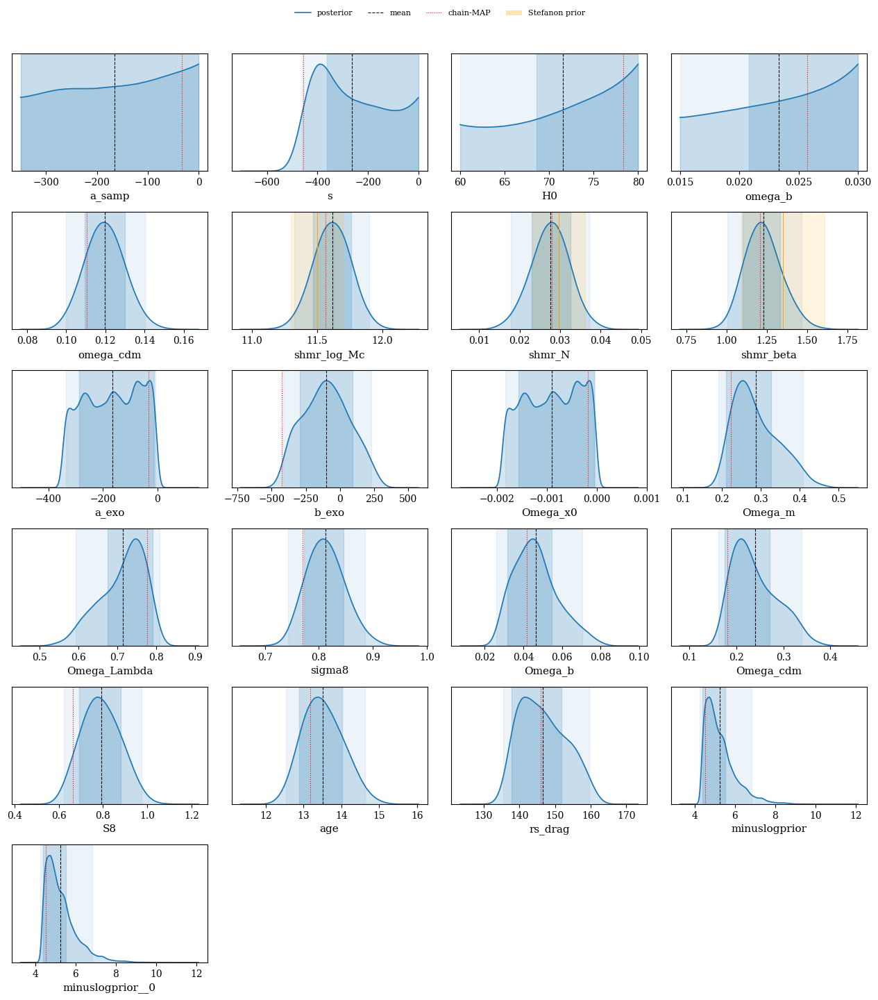


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  exo_uvlf_vshmr_restr
──────────────────────────────────────────────────────────────────────


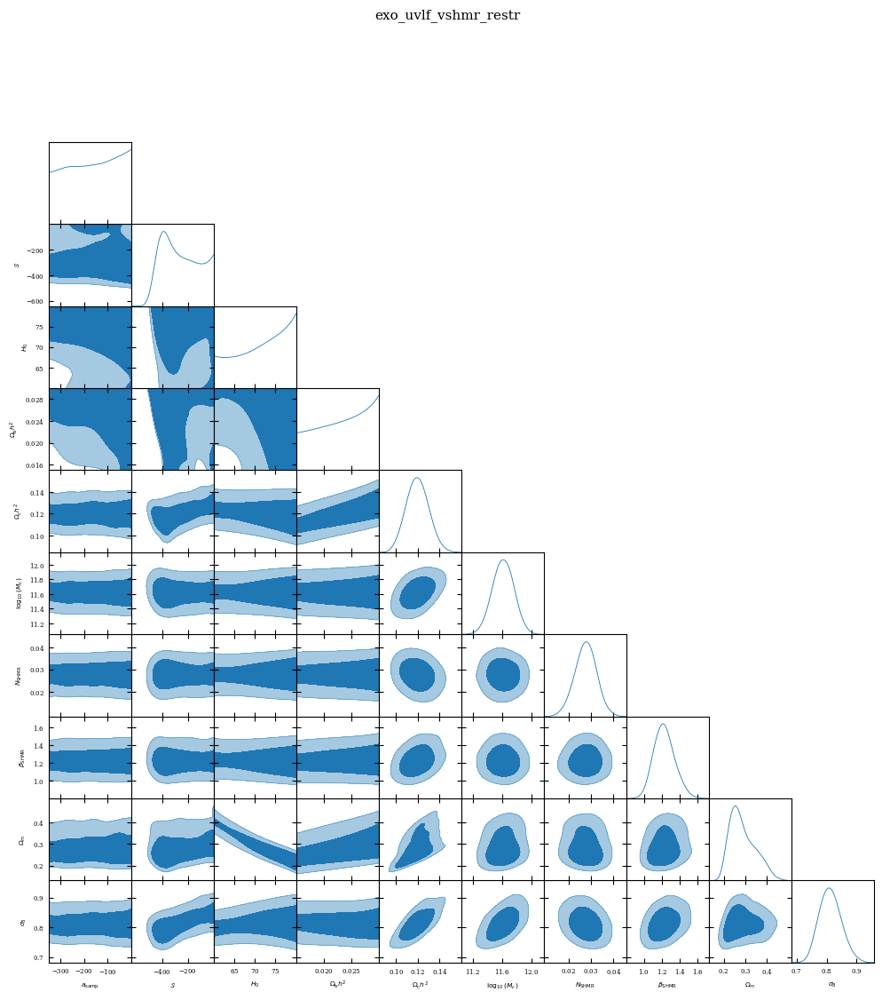


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  exo_uvlf_vshmr_restr
──────────────────────────────────────────────────────────────────────


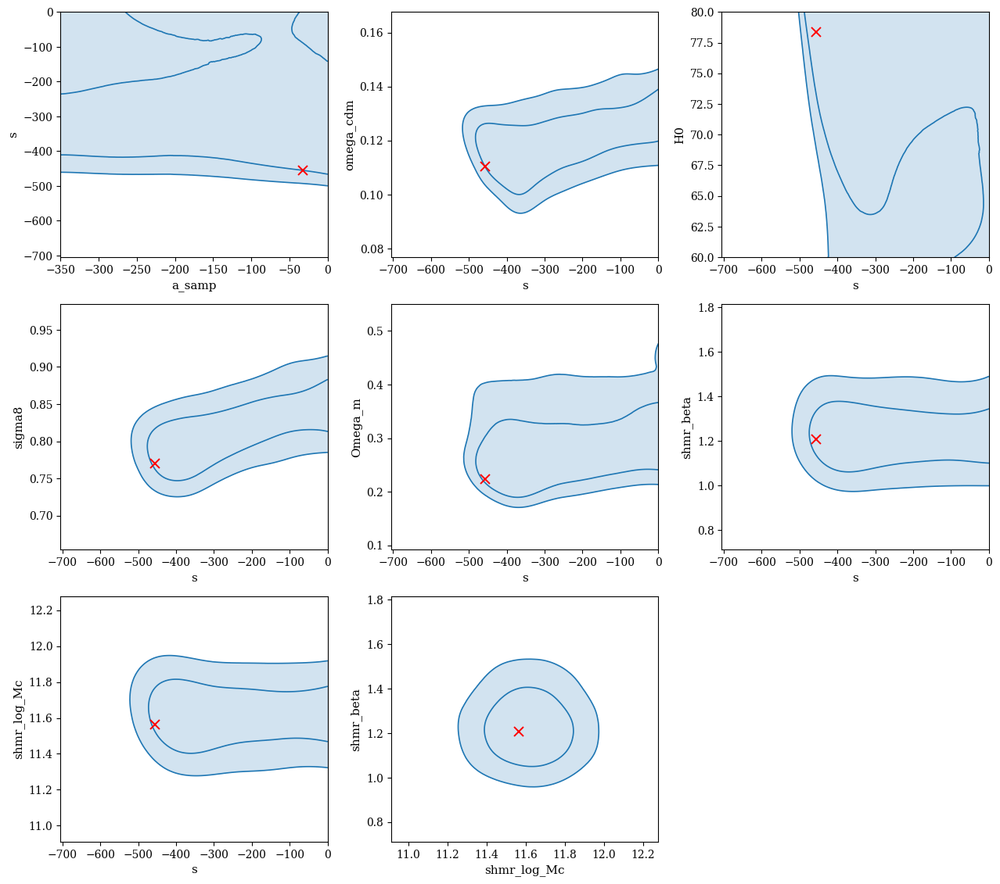


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  exo_uvlf_vshmr_restr
──────────────────────────────────────────────────────────────────────


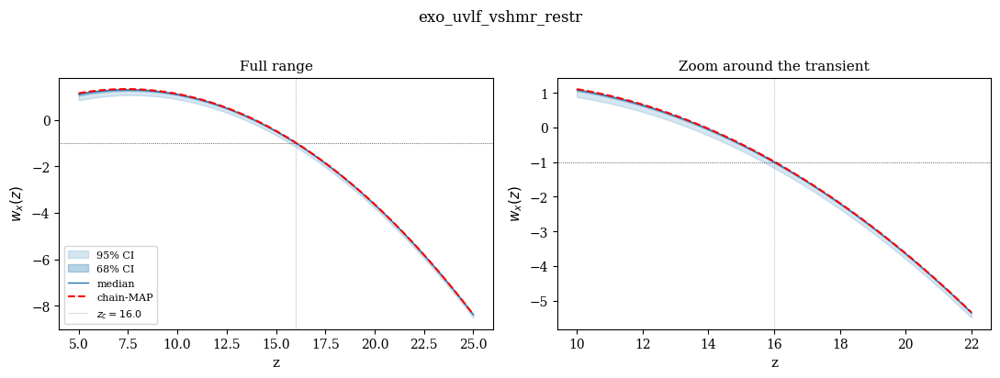


──── Plotting: lcdm_bg ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  lcdm_bg
──────────────────────────────────────────────────────────────────────


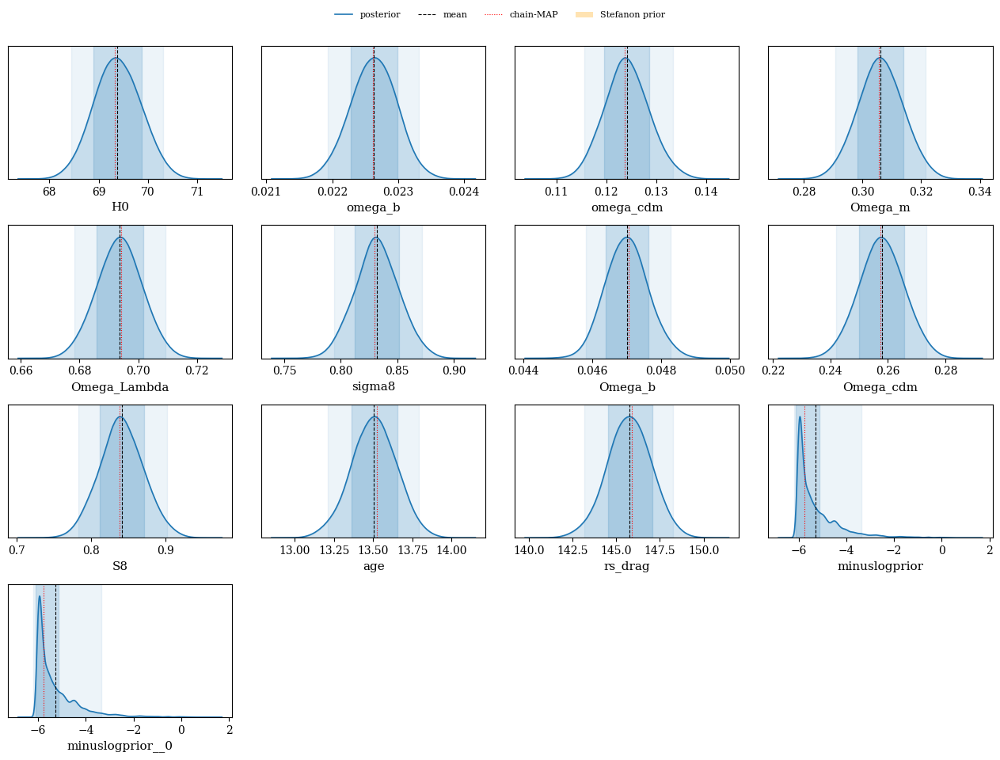


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  lcdm_bg
──────────────────────────────────────────────────────────────────────


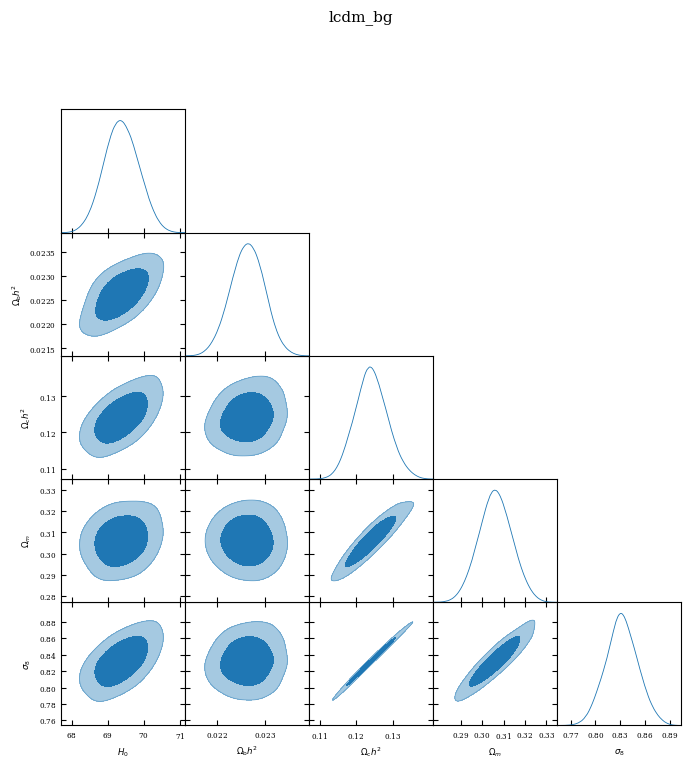


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  lcdm_bg
──────────────────────────────────────────────────────────────────────


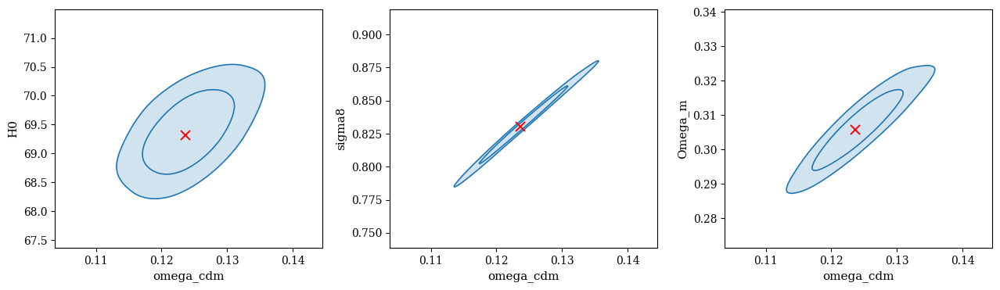


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  lcdm_bg
──────────────────────────────────────────────────────────────────────
  LCDM cell — w(z) ≡ -1. Skipping.

──── Plotting: lcdm_bg_cmb ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  lcdm_bg_cmb
──────────────────────────────────────────────────────────────────────


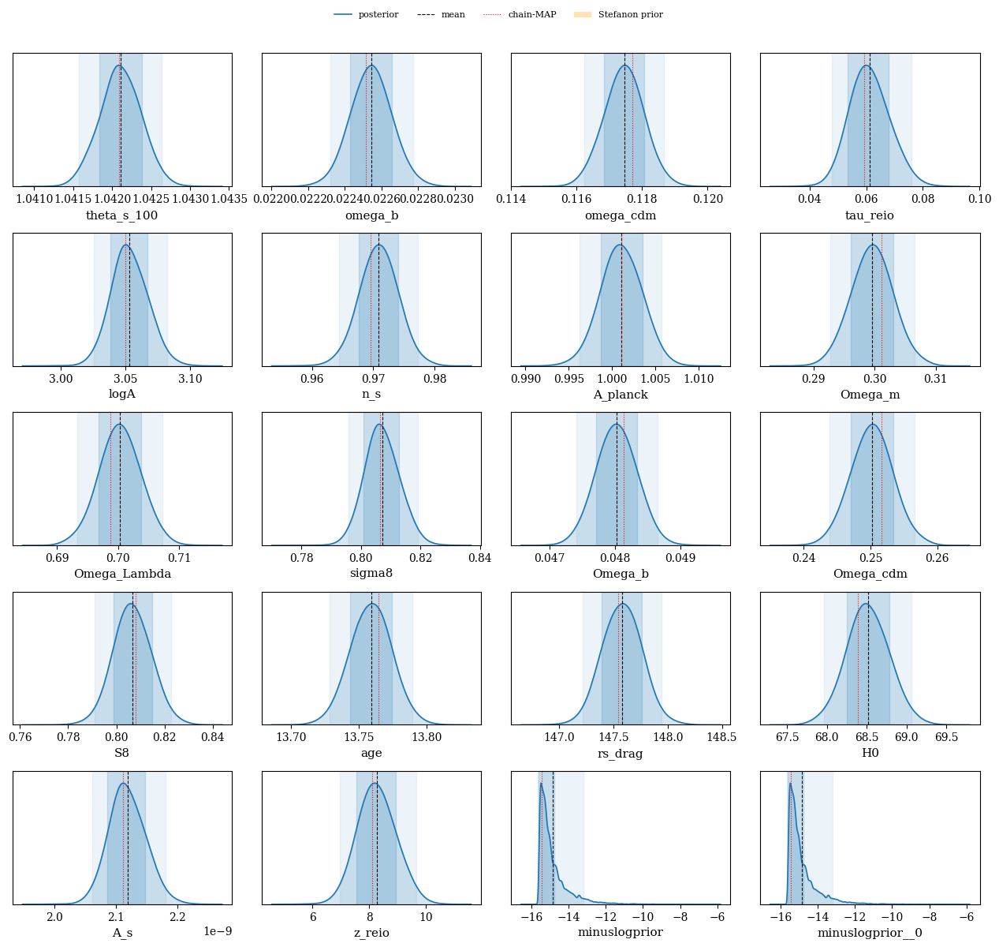


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  lcdm_bg_cmb
──────────────────────────────────────────────────────────────────────


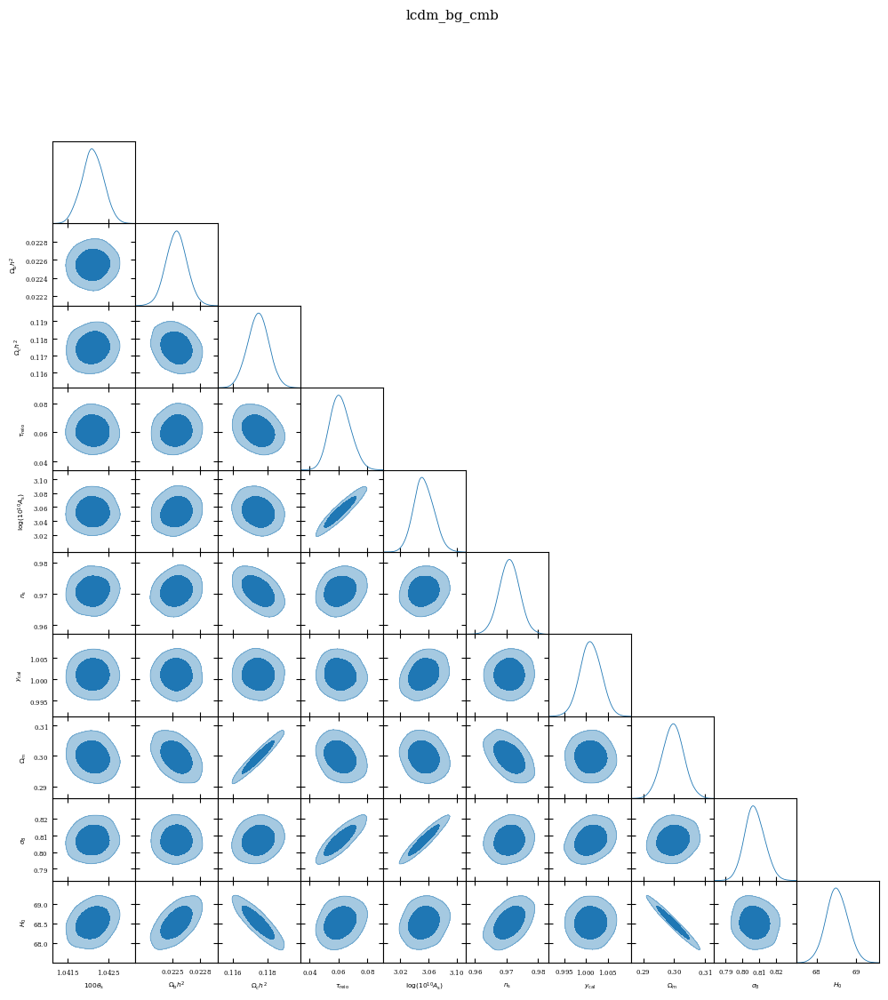


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  lcdm_bg_cmb
──────────────────────────────────────────────────────────────────────


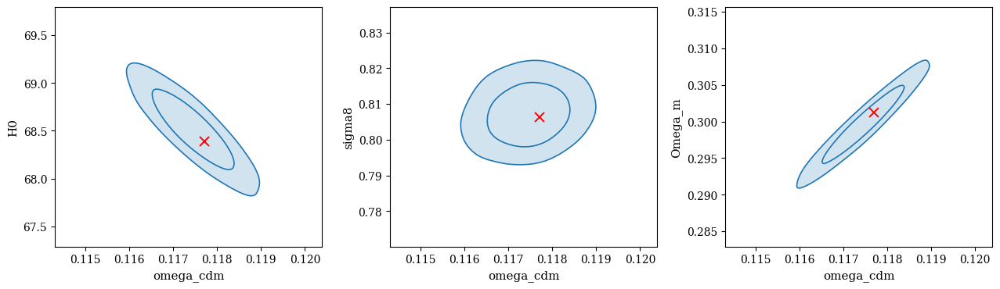


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  lcdm_bg_cmb
──────────────────────────────────────────────────────────────────────
  LCDM cell — w(z) ≡ -1. Skipping.

──── Plotting: lcdm_primer_fixed_full ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  lcdm_primer_fixed_full
──────────────────────────────────────────────────────────────────────


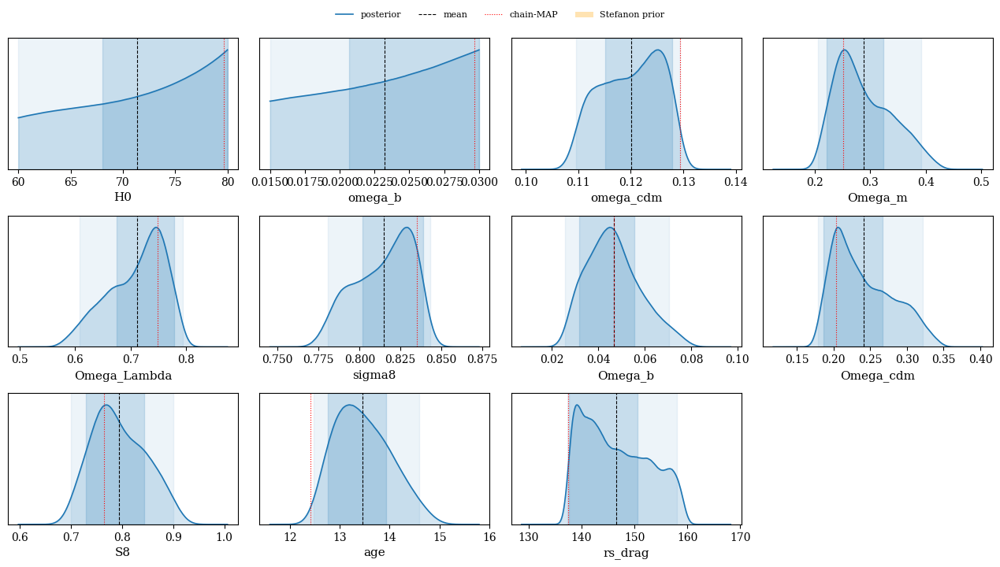


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  lcdm_primer_fixed_full
──────────────────────────────────────────────────────────────────────


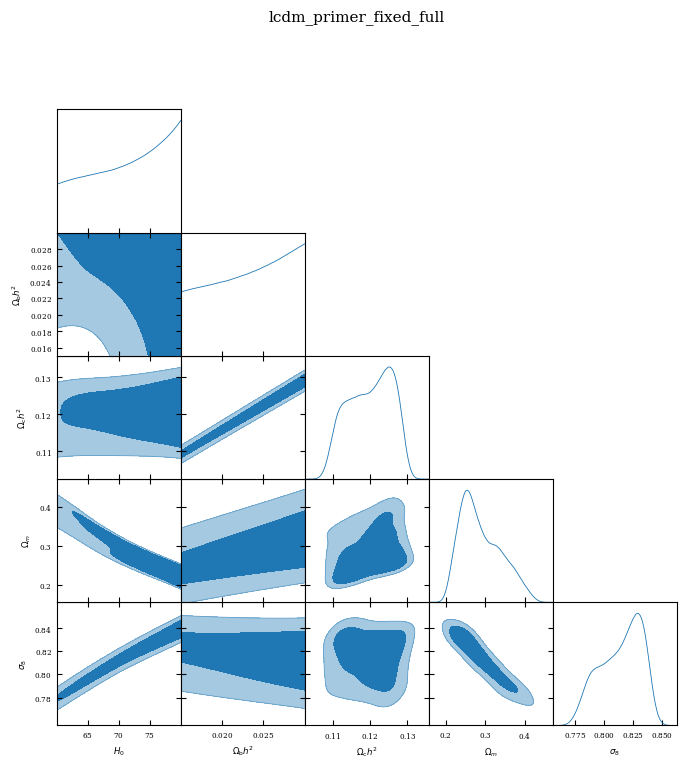


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  lcdm_primer_fixed_full
──────────────────────────────────────────────────────────────────────


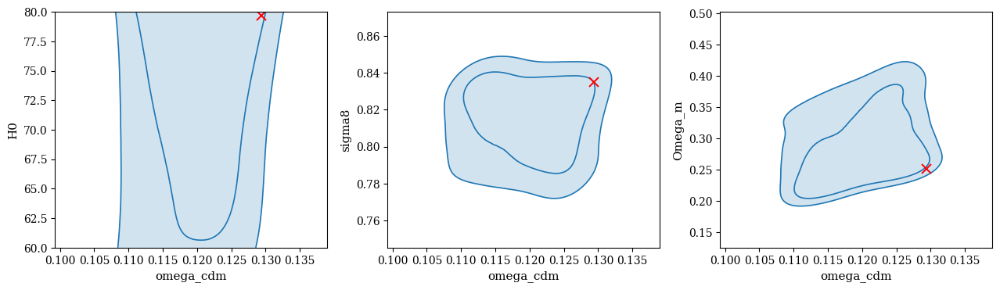


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  lcdm_primer_fixed_full
──────────────────────────────────────────────────────────────────────
  LCDM cell — w(z) ≡ -1. Skipping.

──── Plotting: lcdm_uvlf_bg_cmb_fixed_full ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  lcdm_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────


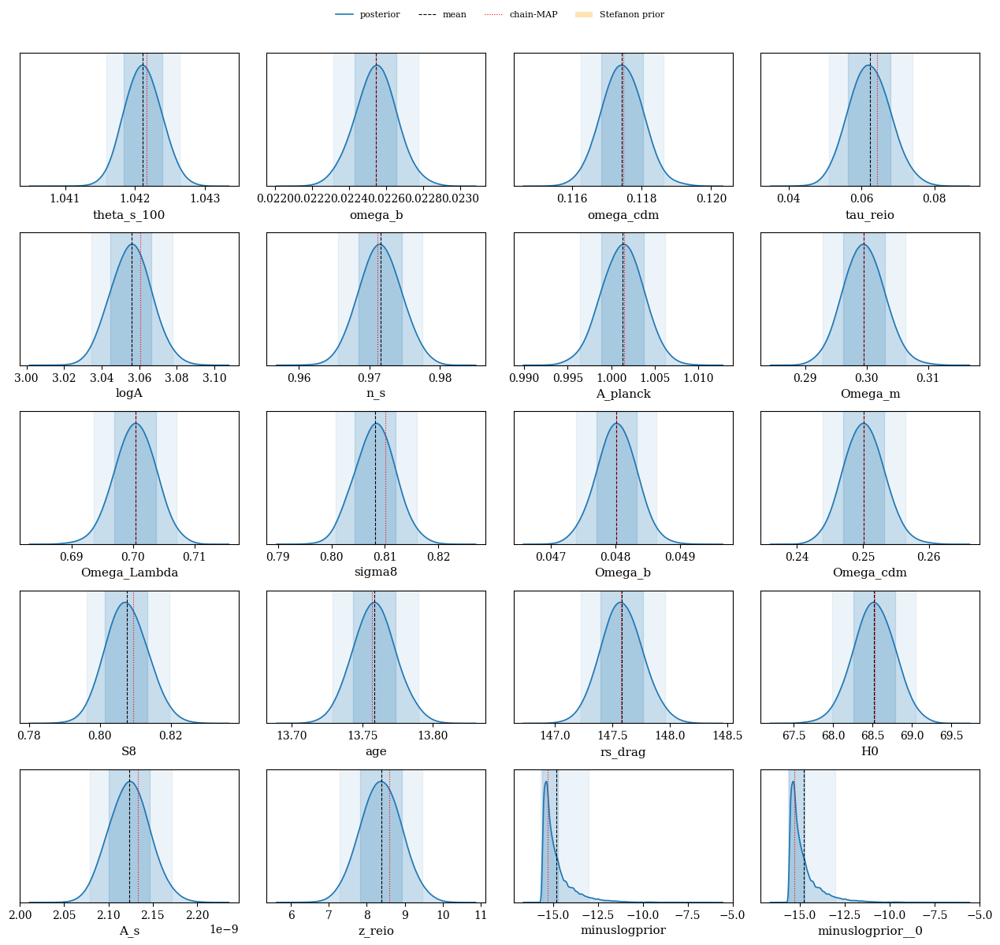


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  lcdm_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────


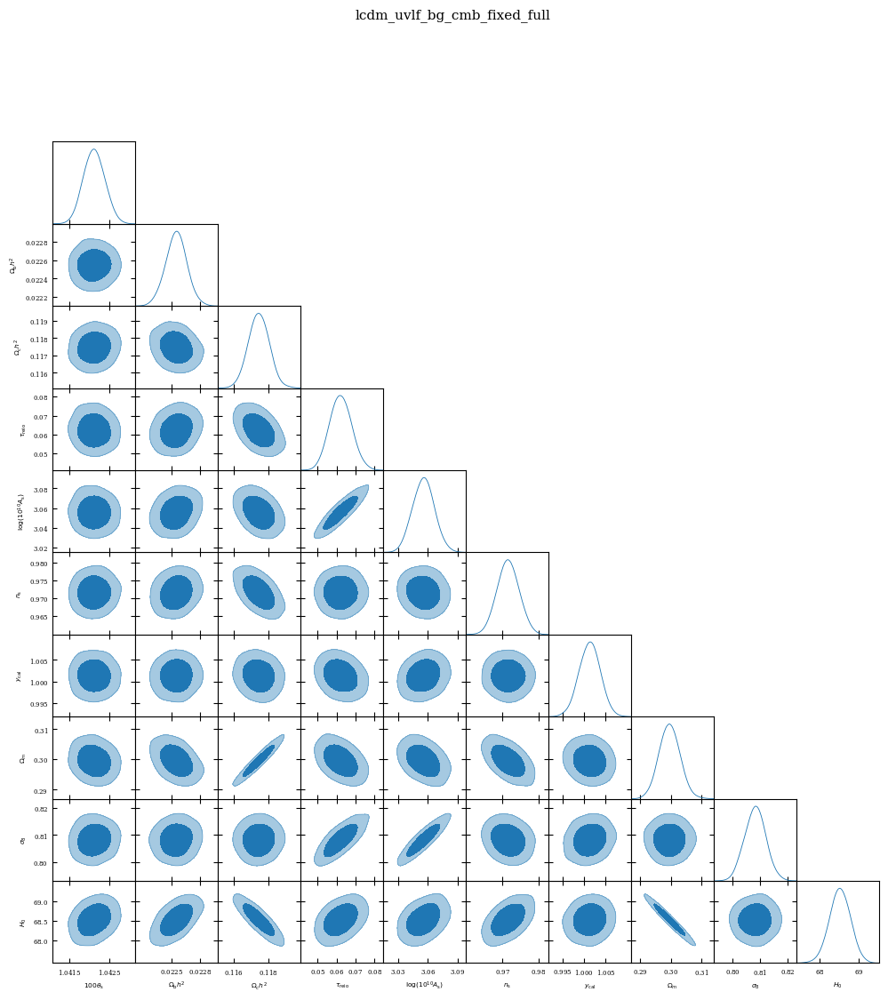


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  lcdm_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────


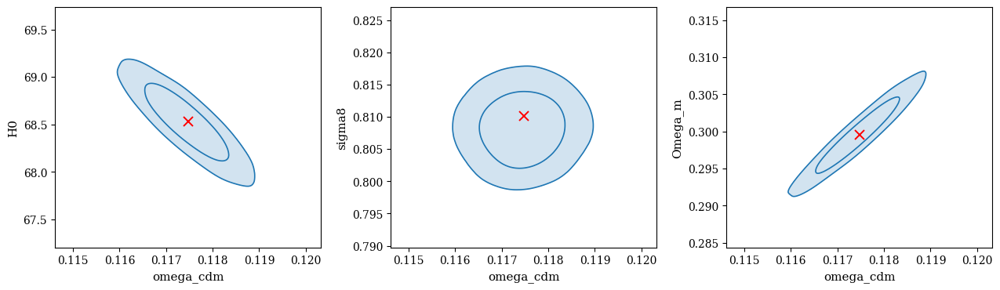


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  lcdm_uvlf_bg_cmb_fixed_full
──────────────────────────────────────────────────────────────────────
  LCDM cell — w(z) ≡ -1. Skipping.

──── Plotting: lcdm_uvlf_bg_cmb_vbeta_full ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  lcdm_uvlf_bg_cmb_vbeta_full
──────────────────────────────────────────────────────────────────────


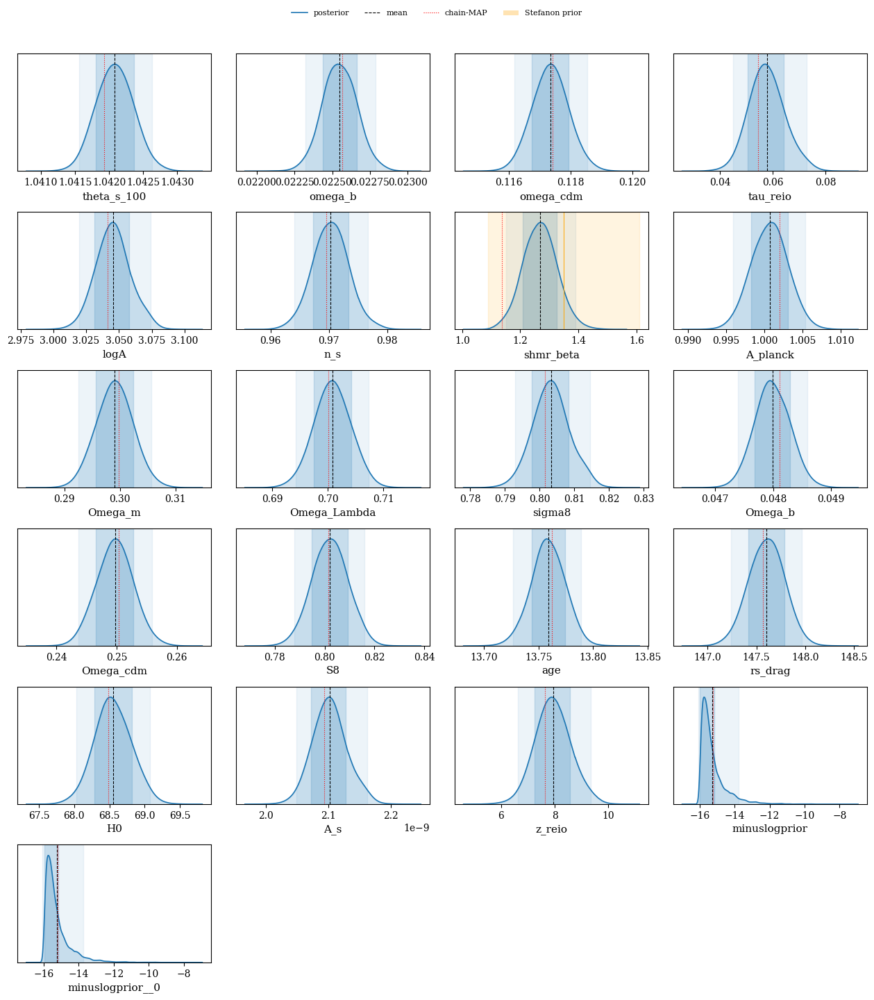


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  lcdm_uvlf_bg_cmb_vbeta_full
──────────────────────────────────────────────────────────────────────


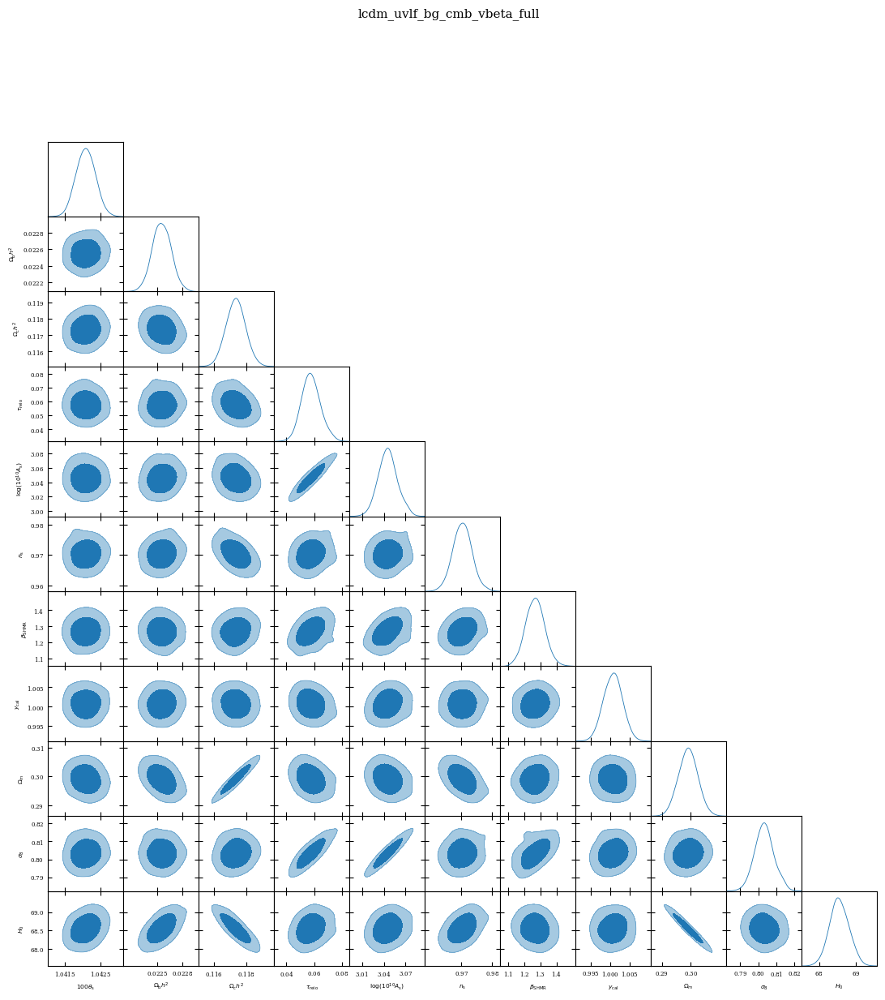


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  lcdm_uvlf_bg_cmb_vbeta_full
──────────────────────────────────────────────────────────────────────


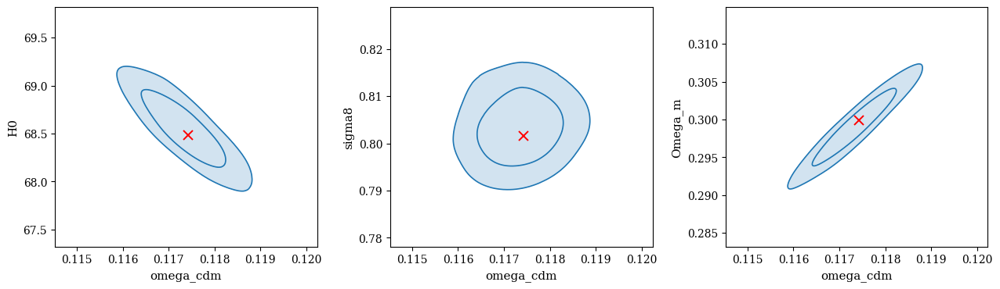


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  lcdm_uvlf_bg_cmb_vbeta_full
──────────────────────────────────────────────────────────────────────
  LCDM cell — w(z) ≡ -1. Skipping.

──── Plotting: lcdm_uvlf_bg_cmb_vshmr_full ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  lcdm_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────


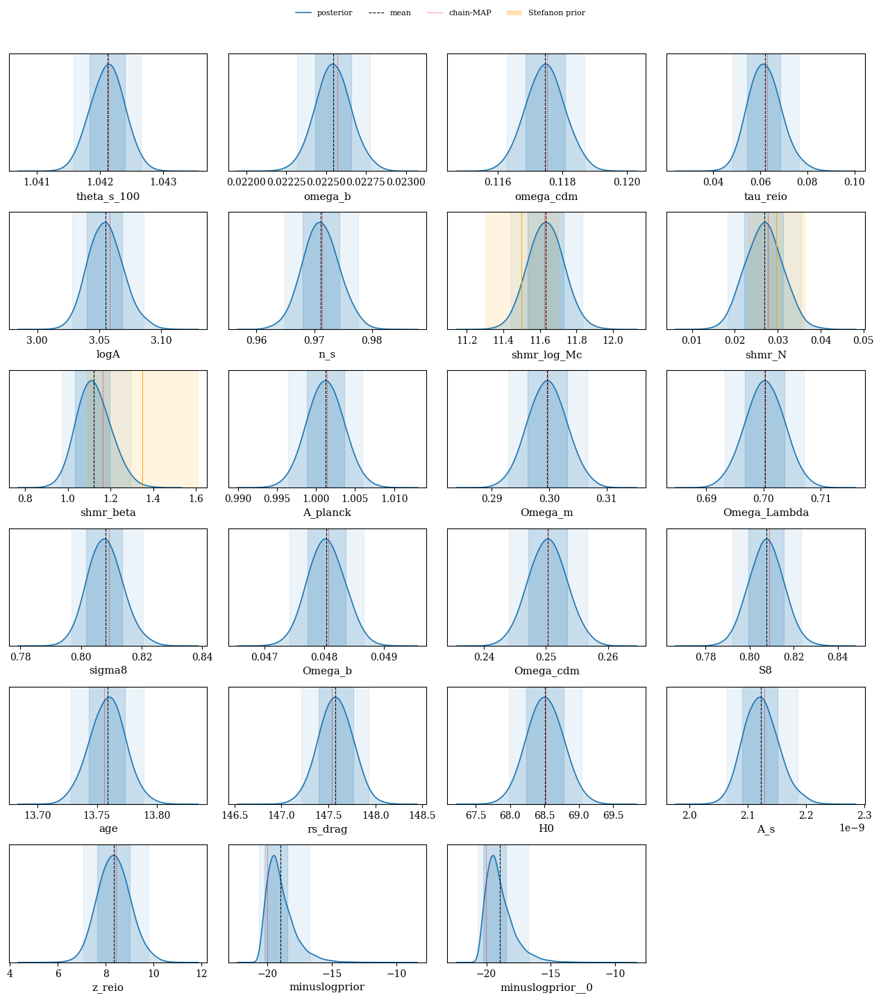


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  lcdm_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────


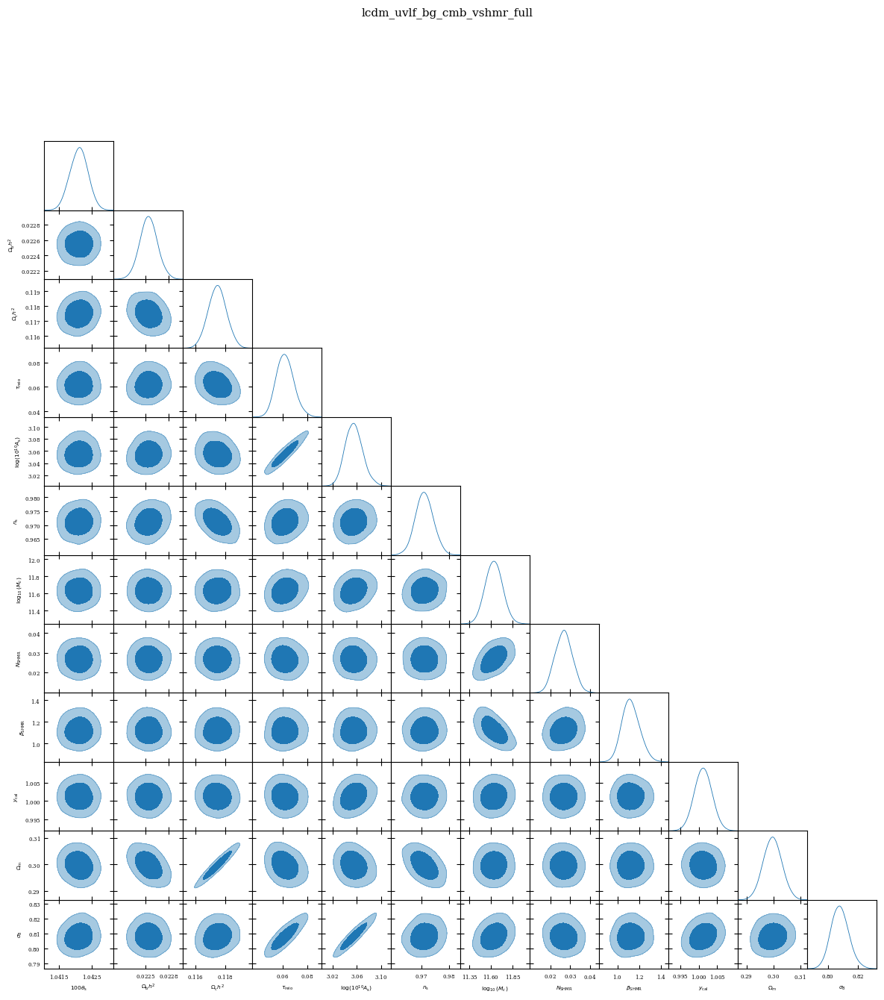


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  lcdm_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────


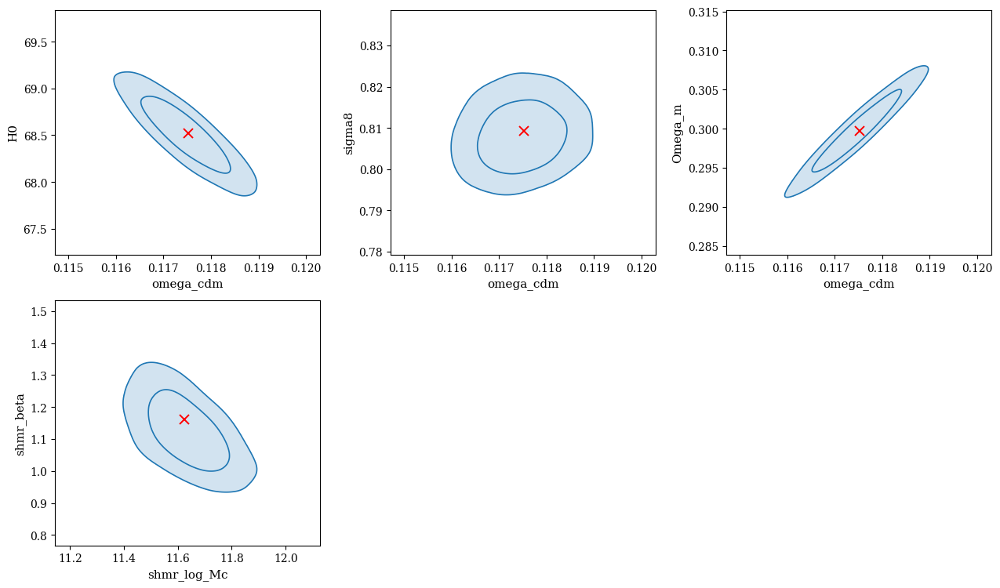


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  lcdm_uvlf_bg_cmb_vshmr_full
──────────────────────────────────────────────────────────────────────
  LCDM cell — w(z) ≡ -1. Skipping.

──── Plotting: lcdm_uvlf_bg_cmb_vshmr_restr ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  lcdm_uvlf_bg_cmb_vshmr_restr
──────────────────────────────────────────────────────────────────────


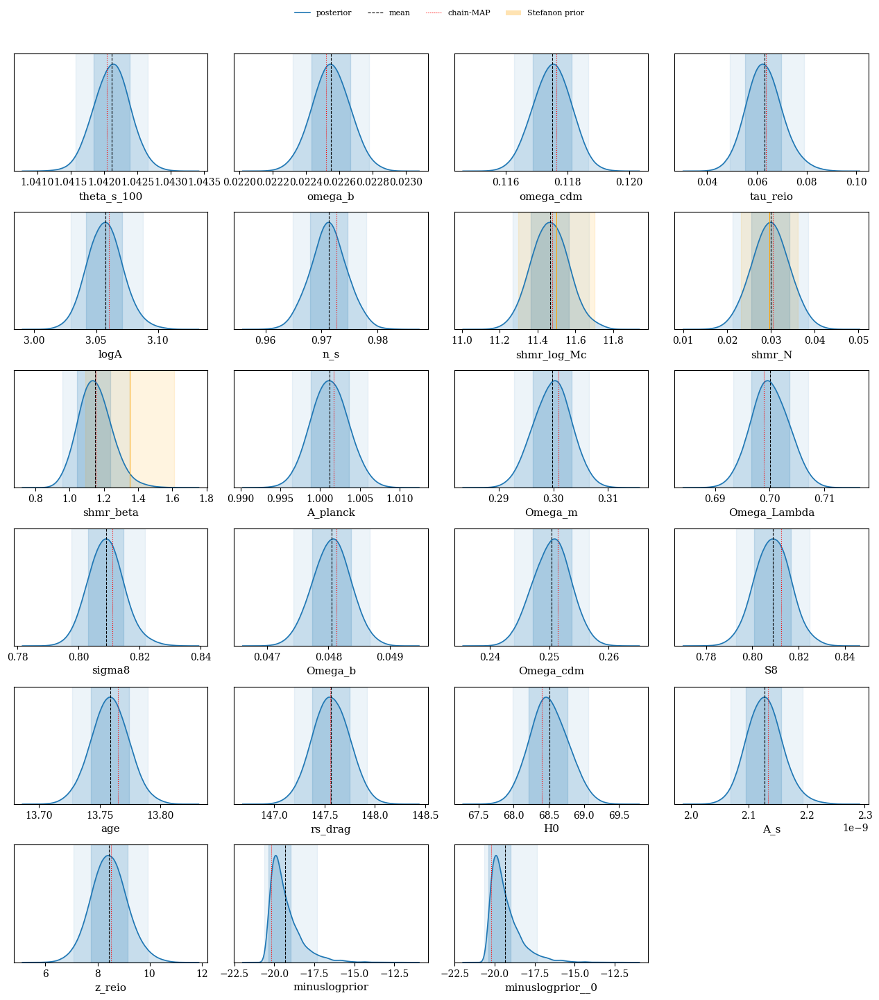


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  lcdm_uvlf_bg_cmb_vshmr_restr
──────────────────────────────────────────────────────────────────────


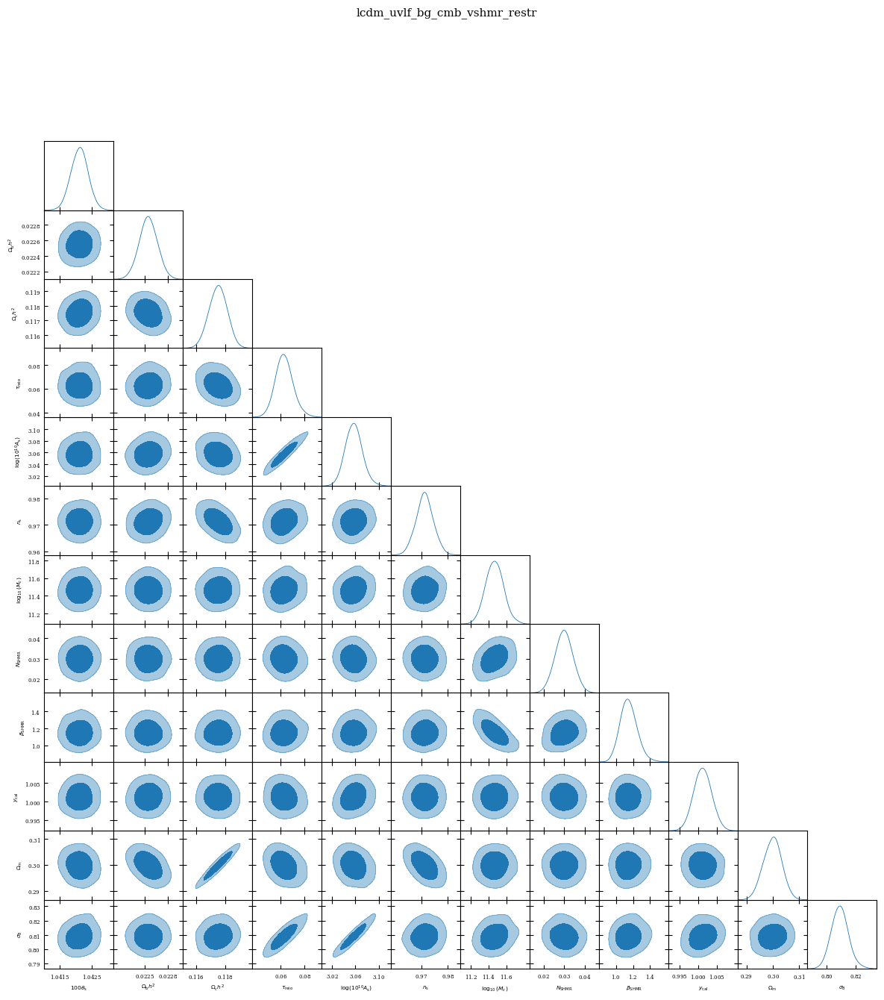


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  lcdm_uvlf_bg_cmb_vshmr_restr
──────────────────────────────────────────────────────────────────────


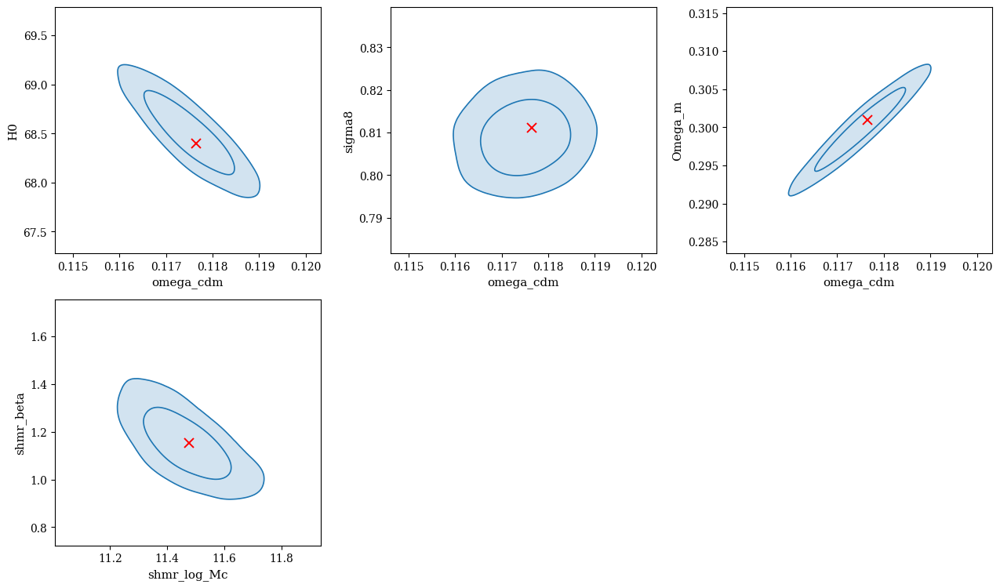


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  lcdm_uvlf_bg_cmb_vshmr_restr
──────────────────────────────────────────────────────────────────────
  LCDM cell — w(z) ≡ -1. Skipping.

──── Plotting: lcdm_uvlf_bg_fixed_full ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  lcdm_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────


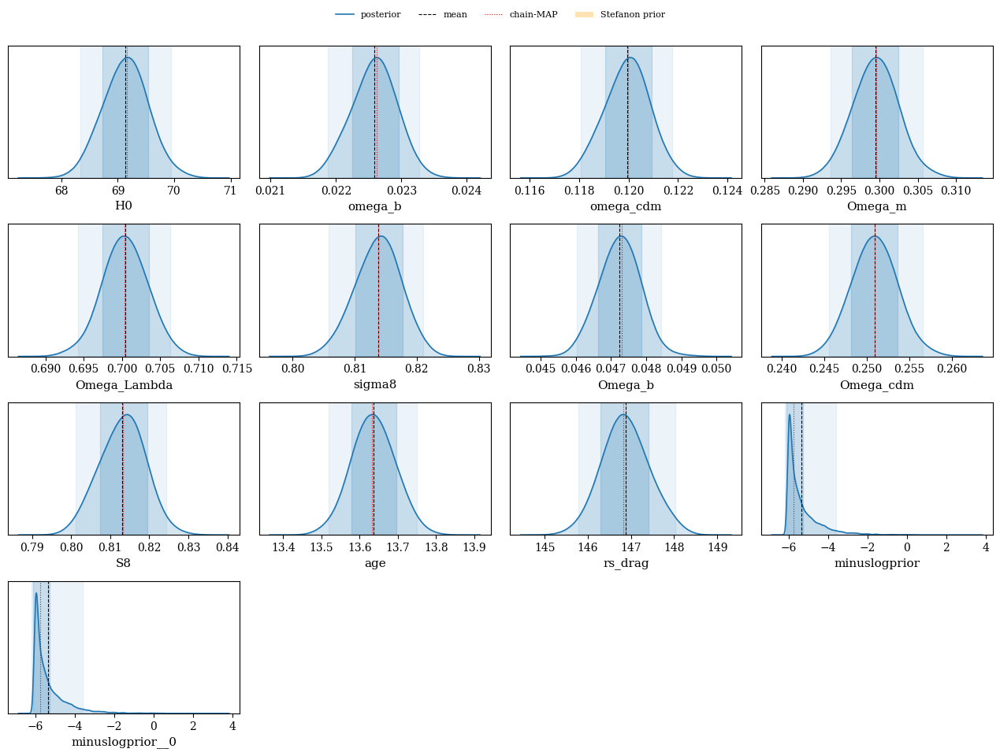


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  lcdm_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────


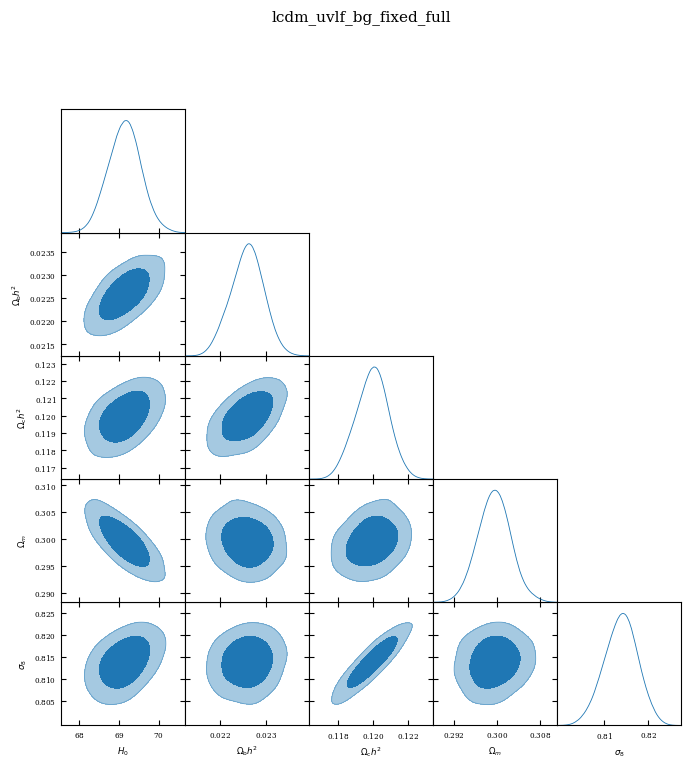


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  lcdm_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────


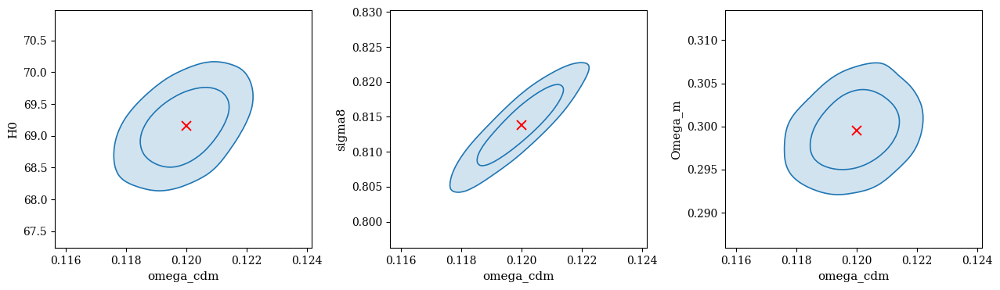


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  lcdm_uvlf_bg_fixed_full
──────────────────────────────────────────────────────────────────────
  LCDM cell — w(z) ≡ -1. Skipping.

──── Plotting: lcdm_uvlf_fixed_full ────

──────────────────────────────────────────────────────────────────────
§2 1D Marginals  —  lcdm_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────


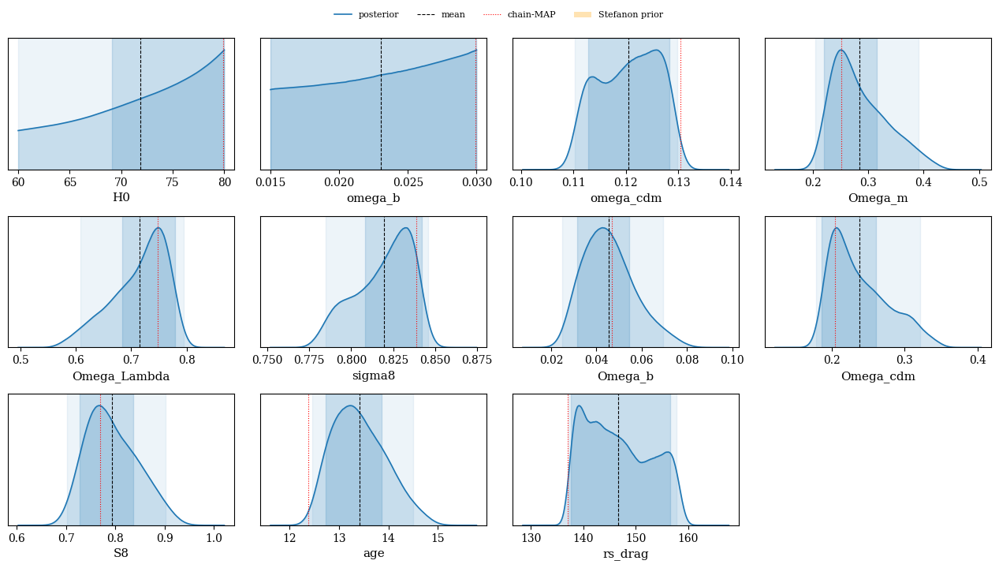


──────────────────────────────────────────────────────────────────────
§3 Triangle Plot  —  lcdm_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────


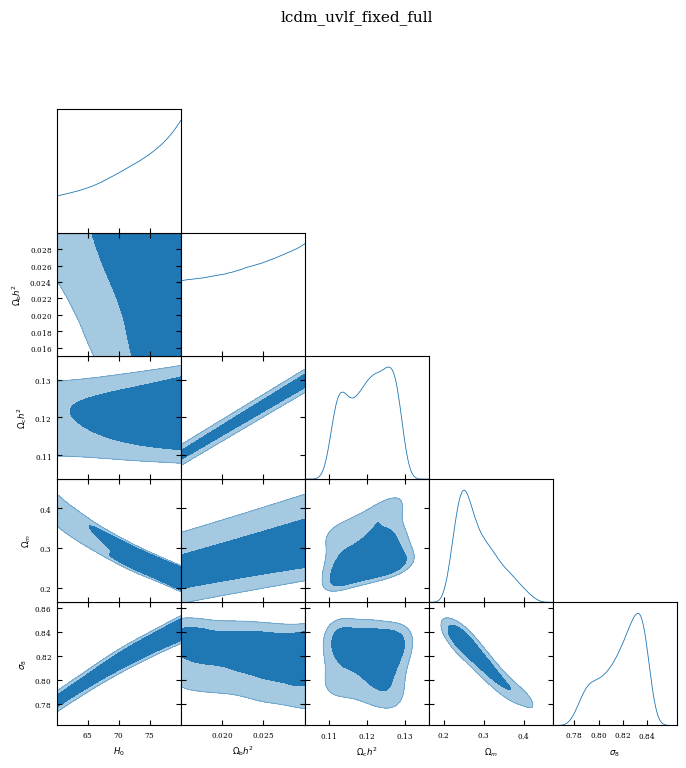


──────────────────────────────────────────────────────────────────────
§4 Headline 2D Pairs  —  lcdm_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────


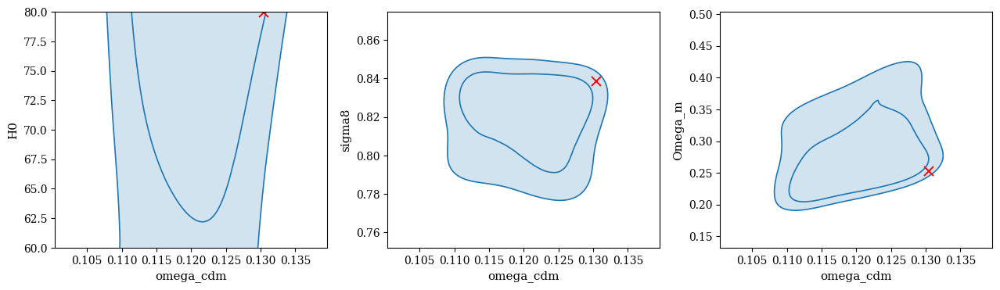


──────────────────────────────────────────────────────────────────────
§6 w(z) Reconstruction  —  lcdm_uvlf_fixed_full
──────────────────────────────────────────────────────────────────────
  LCDM cell — w(z) ≡ -1. Skipping.

──────────────────────────────────────────────────────────────────────
§7 Cross-Run Contours (16 runs)
──────────────────────────────────────────────────────────────────────


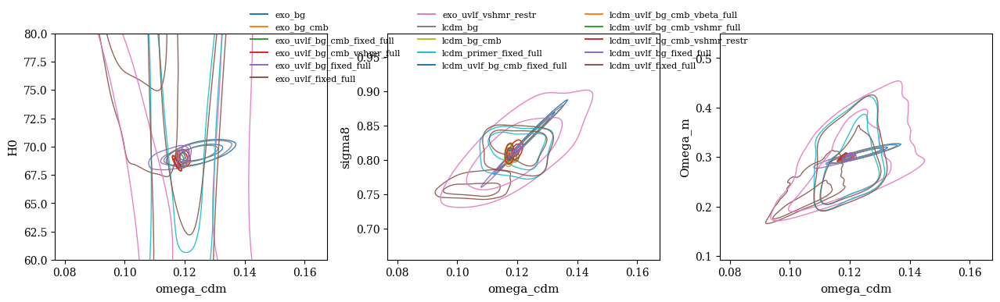


══════════════════════════════════════════════════════════════════════
  Plotting loop complete.
══════════════════════════════════════════════════════════════════════


In [16]:
for r in runs_data:
    print(f"\n──── Plotting: {r.name} ────")
    section2_marginals(r)
    section3_triangle(r)
    section4_headline_pairs(r)
    section6_wz(r)

if MODE_RESOLVED == "compare" and len(runs_data) >= 2:
    section7_cross_run_plots(runs_data)

print("\n" + "═"*70)
print("  Plotting loop complete.")
print("═"*70)